In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import glob
import os
import pickle
import random
import sys

import ivac
import matplotlib as mpl
import matplotlib.pyplot as plt
import mdtraj as md
import numpy as np
import pyemma
import scipy
import seaborn as sns
from matplotlib import ticker
from sklearn.cluster import MiniBatchKMeans
from sklearn.neighbors import NearestNeighbors

import extq
import prettypyplot as pplt

In [3]:
from joblib import Memory

In [4]:
! source /project/dinner/scguo/upside2/sourceme.sh

In [5]:
# upside_path = os.environ["UPSIDE_HOME"]
upside_path = "/project/dinner/scguo/upside2/"
upside_utils_dir = os.path.expanduser(upside_path + "/py")
sys.path.insert(0, upside_utils_dir)

In [6]:
plt.style.use("custom")  # custom style sheet
plt.style.use("vibrant")  # muted color theme from SciencePlots
pplt.load_cmaps()

In [7]:
plt.rcParams[
    "text.latex.preamble"
] = r"\usepackage{siunitx}\sisetup{detect-all}\usepackage{helvet}\usepackage{sansmath}\sansmath"
mpl.rcParams["font.family"] = "sans-serif"
mpl.rcParams["font.sans-serif"] = "cm"

# Load data

In [8]:
TEMP = 91
home_dir = "/project/dinner/scguo/kaiB"
base_dir = f"{home_dir}/dga/new_{TEMP}"
data_dir = f"{base_dir}/data"

In [9]:
traj_files = []
for i in range(1, 12289):
    j = i // 1000
    for iso in ("cis", "trans"):
        head = f"{base_dir}/{j:02}/{i:05}/outputs/{i:05}_{iso}"
        listed = glob.glob(f"{base_dir}/{j:02}/{i:05}/{iso}/*.h5")
        if len(listed) != 0:
            traj_files.extend(listed)

In [10]:
len(traj_files)

22989

In [11]:
def load_cv(basename):
    arrays = []
    for file in sorted(glob.glob(f"{basename}_??.npy")):
        arrays.append(np.load(file))
    return np.concatenate(arrays)

In [12]:
fs_qtots = load_cv(f"{data_dir}/fs_qtots")
f_rmsds = load_cv(f"{data_dir}/f_rmsds")
r_rmsds = load_cv(f"{data_dir}/r_rmsds")
p_rmsds = load_cv(f"{data_dir}/p_rmsds")
q_gs_all = load_cv(f"{data_dir}/q_gs_all")
q_gs = load_cv(f"{data_dir}/q_gs")
q_fs_all = load_cv(f"{data_dir}/q_fs_all")
q_fs = load_cv(f"{data_dir}/q_fs")
q_core = load_cv(f"{data_dir}/q_core")
omegas = load_cv(f"{data_dir}/omegas")

In [13]:
fs_qtots.shape, q_gs.shape, omegas.shape

((22989, 8, 1001), (22989, 1001), (22989, 1001, 7))

In [14]:
weights = np.load(f"{data_dir}/mbar_weights.npy")

In [15]:
weights.shape

(384, 32000)

In [16]:
def get_traj_ids(base_dir):
    ids = []
    k = 0
    for i in range(1, 12289):
        j = i // 1000
        for iso in ("cis", "trans"):
            head = f"{base_dir}/{j:02}/{i:05}/outputs/{i:05}_{iso}"
            if len(glob.glob(f"{base_dir}/{j:02}/{i:05}/{iso}/*.up")) > 0:
                ids.append(k)
            k += 1
    return np.array(ids)


def get_weights(weights, N, k, ids):
    sampled_w = np.concatenate(weights[:, -N::k])
    # set weight for cis/trans to be the same
    sampled_w = np.repeat(sampled_w, 2)
    return sampled_w[ids]

In [17]:
ids = get_traj_ids(base_dir)
print(len(ids))

22989


In [18]:
N = 32000
k = 1000
sample_w = get_weights(weights, N, k, ids)
print(sample_w.shape)

(22989,)


In [19]:
c_green = fs_qtots[:, 5] - fs_qtots[:, 4]
c_blue = fs_qtots[:, 7] - fs_qtots[:, 6]
c_orange = fs_qtots[:, 3] - fs_qtots[:, 2]
c_0 = fs_qtots[:, 1] - fs_qtots[:, 0]

In [20]:
n_cis = np.sum((np.abs(omegas[..., 3:]) <= (np.pi / 2.0)).astype(int), axis=-1)
p63_cis = (np.abs(omegas[..., 3]) <= (np.pi / 2.0)).astype(int)
p70_cis = (np.abs(omegas[..., 4]) <= (np.pi / 2.0)).astype(int)
p71_cis = (np.abs(omegas[..., 5]) <= (np.pi / 2.0)).astype(int)
p72_cis = (np.abs(omegas[..., 6]) <= (np.pi / 2.0)).astype(int)

# CVs

In [21]:
names = ["blue", "green", "orange", "c0", "r_rmsd", "q_gs_all", "q_fs_all", "q_core", "n_cis"]
labels = dict(
    blue=r"$\alpha3_{\mathrm{fs}}\longleftrightarrow\beta4_{\mathrm{gs}}$",
    green=r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    orange=r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    c0=r"$\alpha2_{\mathrm{fs}}\longleftrightarrow\beta3_{\mathrm{gs}}$",
    r_rmsd=r"N-term RMSD (nm)",
    q_gs_all=r"$Q_{\mathrm{gs}}$",
    q_fs_all=r"$Q_{\mathrm{fs}}$",
    q_core=r"$Q_{\mathrm{N-term}}$",
    n_cis=r"$n_{\mathrm{cis}}$",
)
cvs = dict(
    blue=c_blue,
    green=c_green,
    orange=c_orange,
    c0=c_0,
    r_rmsd=r_rmsds,
    q_gs_all=q_gs_all,
    q_fs_all=q_fs_all,
    q_core=q_core,
    n_cis=n_cis,
)
lims = dict(
    blue=(-1, 1.3),
    green=(-1.3, 1),
    orange=(-1.3, 1),
    c0=(-1, 1.3),
    r_rmsd=(0, 1.2),
    q_gs_all=(0, 1),
    q_fs_all=(0, 1),
    q_core=(0, 1),
    n_cis=(0, 2),
)

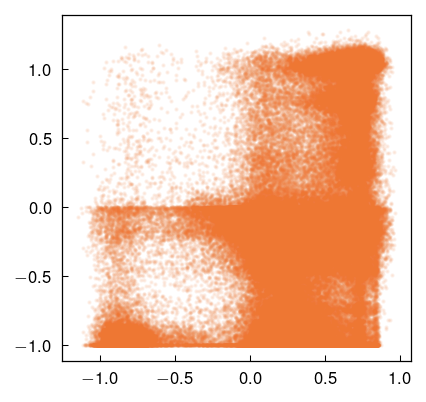

In [22]:
plt.plot(np.concatenate(c_green)[::100], np.concatenate(c_blue)[::100], ".", alpha=0.1)

## PMFs

/scratch/local/jobs/15766754/ipykernel_1582212/4059407973.py:10: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(dens))
/scratch/local/jobs/15766754/ipykernel_1582212/4059407973.py:11: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(dens) - offset


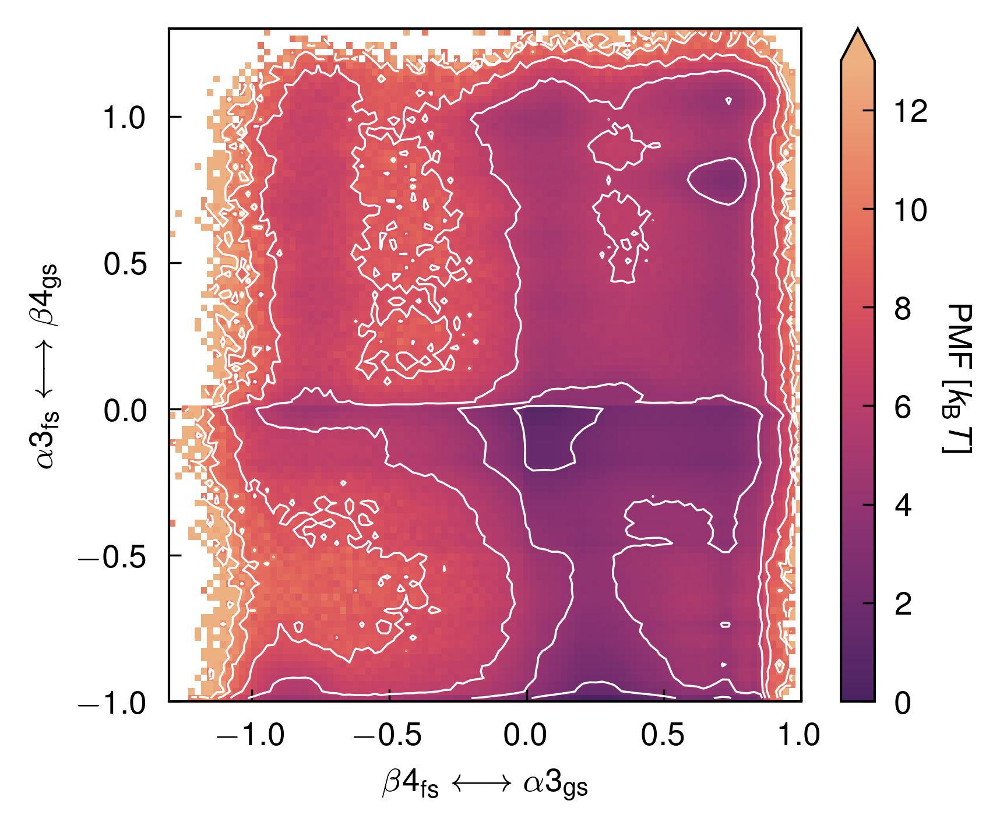

In [23]:
# use mbar weights
cv1, cv2 = "green", "blue"
xe = np.linspace(*lims[cv1], 101)
ye = np.linspace(*lims[cv2], 101)
xc = (xe[:-1] + xe[1:]) / 2
yc = (ye[:-1] + ye[1:]) / 2
dens = extq.projection.density2d(
    cvs[cv1], cvs[cv2], np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
)
offset = np.min(-np.log(dens))
pmf = -np.log(dens) - offset

fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)
clines = np.arange(0, 13, 2)
pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
ax.set_xlabel(labels[cv1])
ax.set_ylabel(labels[cv2])
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

/scratch/local/jobs/15766754/ipykernel_1582212/39789790.py:8: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(dens))
/scratch/local/jobs/15766754/ipykernel_1582212/39789790.py:9: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(dens) - offset


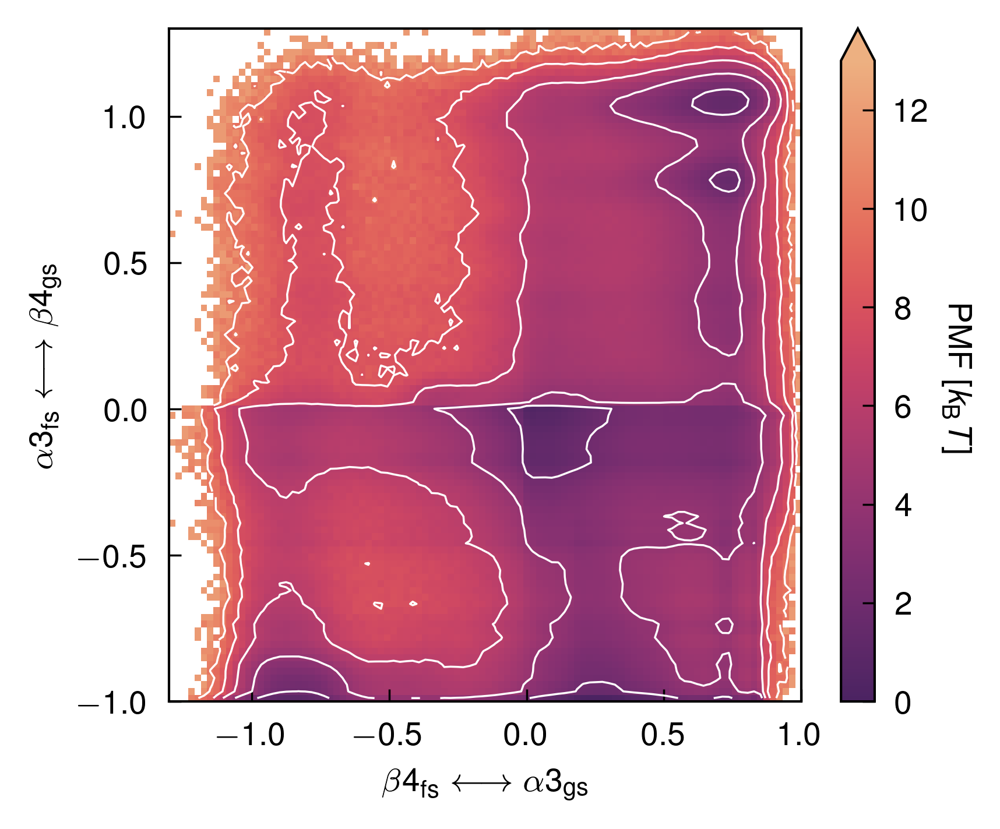

In [24]:
# use uniform weights
cv1, cv2 = "green", "blue"
xe = np.linspace(*lims[cv1], 101)
ye = np.linspace(*lims[cv2], 101)
xc = (xe[:-1] + xe[1:]) / 2
yc = (ye[:-1] + ye[1:]) / 2
dens = extq.projection.density2d(cvs[cv1], cvs[cv2], extq.utils.uniform_weights(cvs[cv1], 0), xe, ye)
offset = np.min(-np.log(dens))
pmf = -np.log(dens) - offset

fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)
clines = np.arange(0, 13, 2)
pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
ax.set_xlabel(labels[cv1])
ax.set_ylabel(labels[cv2])
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

/scratch/local/jobs/15766754/ipykernel_1582212/1201542916.py:10: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(dens))
/scratch/local/jobs/15766754/ipykernel_1582212/1201542916.py:11: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(dens) - offset


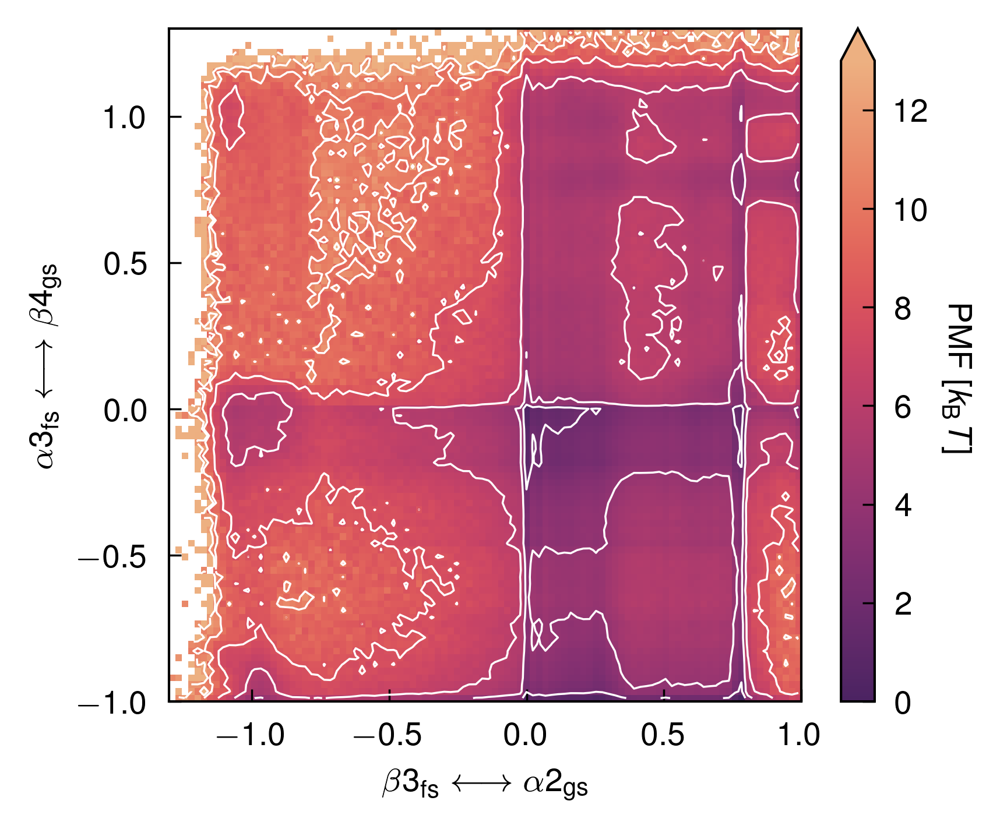

In [25]:
# use mbar weights
cv1, cv2 = "orange", "blue"
xe = np.linspace(*lims[cv1], 101)
ye = np.linspace(*lims[cv2], 101)
xc = (xe[:-1] + xe[1:]) / 2
yc = (ye[:-1] + ye[1:]) / 2
dens = extq.projection.density2d(
    cvs[cv1], cvs[cv2], np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
)
offset = np.min(-np.log(dens))
pmf = -np.log(dens) - offset

fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)
clines = np.arange(0, 13, 2)
pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
ax.set_xlabel(labels[cv1])
ax.set_ylabel(labels[cv2])
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

/scratch/local/jobs/15766754/ipykernel_1582212/4054427983.py:10: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(dens))
/scratch/local/jobs/15766754/ipykernel_1582212/4054427983.py:11: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(dens) - offset


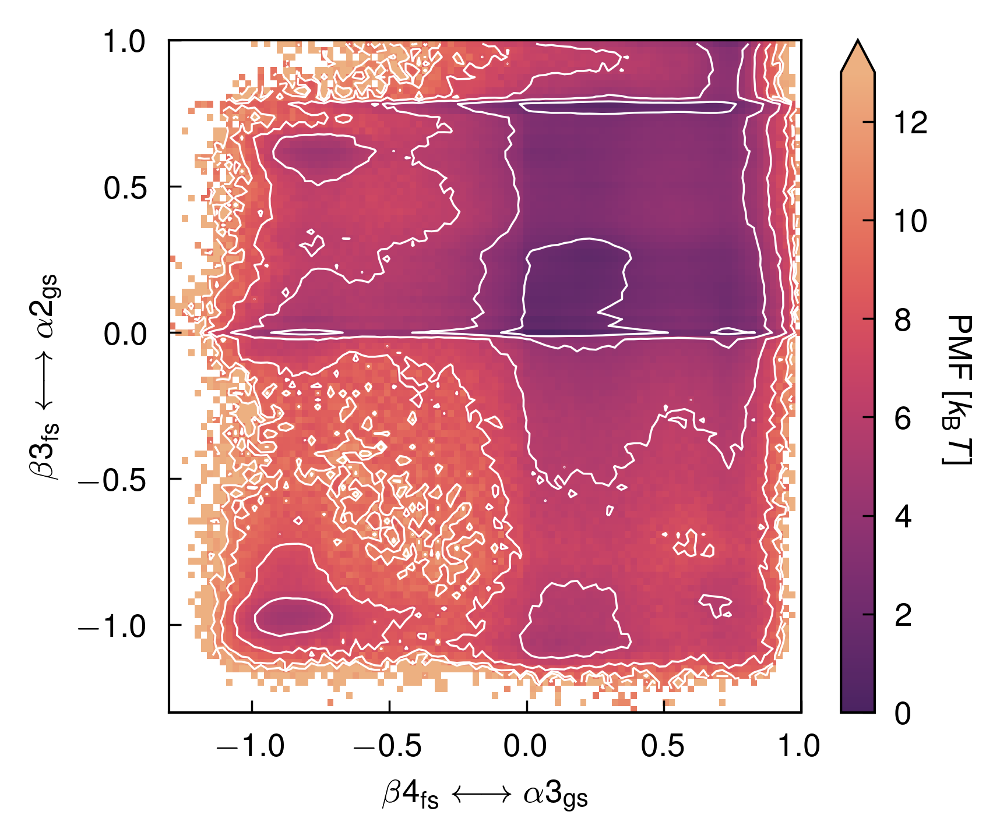

In [26]:
# use mbar weights
cv1, cv2 = "green", "orange"
xe = np.linspace(*lims[cv1], 101)
ye = np.linspace(*lims[cv2], 101)
xc = (xe[:-1] + xe[1:]) / 2
yc = (ye[:-1] + ye[1:]) / 2
dens = extq.projection.density2d(
    cvs[cv1], cvs[cv2], np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
)
offset = np.min(-np.log(dens))
pmf = -np.log(dens) - offset

fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)
clines = np.arange(0, 13, 2)
pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
ax.set_xlabel(labels[cv1])
ax.set_ylabel(labels[cv2])
cb = plt.colorbar(pc, ax=ax, extend="max")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]", rotation=-90, labelpad=10)

/scratch/local/jobs/15766754/ipykernel_1582212/3871751916.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15766754/ipykernel_1582212/3871751916.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


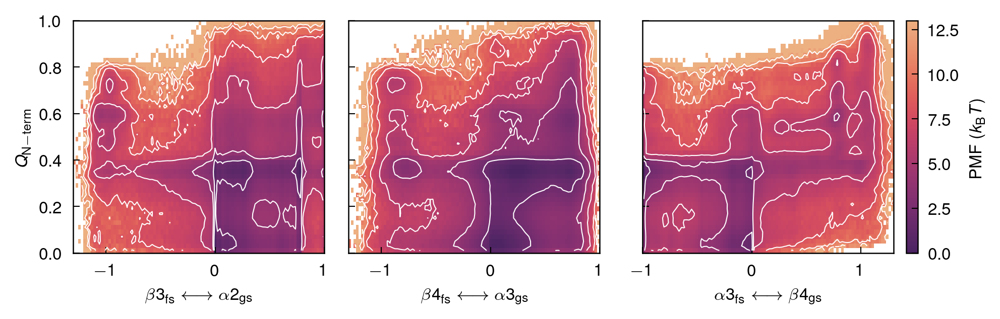

In [27]:
# plot PMFs of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

ye = np.linspace(0, 1.0, 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

for ax, cv in zip(axes, ["orange", "green", "blue"]):
    xe = np.linspace(*lims[cv], 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(
        cvs[cv], q_core, np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
    )
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    # ax.plot(np.array(cv)[in_gs][::100], np.array(q_core)[in_gs][::100], ".", alpha=0.1, color="k")
    # ax.plot(np.array(cv)[in_fs][::100], np.array(q_core)[in_fs][::100], ".", alpha=0.1, color="b")
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(labels["q_core"])
    ax.set_xlabel(labels[cv])
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label=r"PMF ($k_{\mathrm{B}}T$)", location="right")

/scratch/local/jobs/15766754/ipykernel_1582212/3399464565.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15766754/ipykernel_1582212/3399464565.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


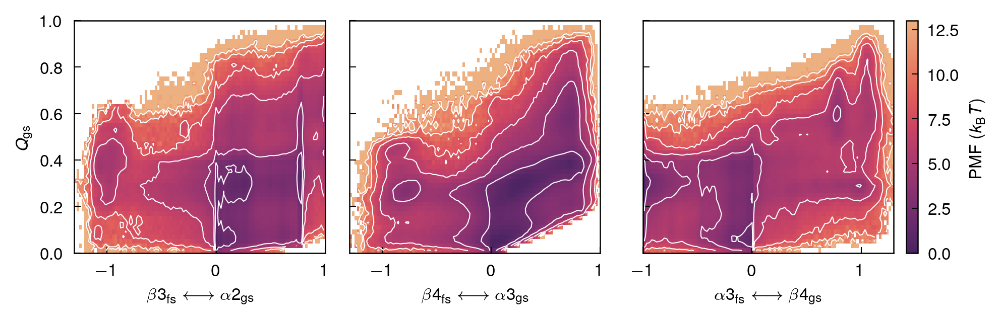

In [28]:
# plot PMFs of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

ye = np.linspace(*lims["q_gs_all"], 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

for ax, cv in zip(axes, ["orange", "green", "blue"]):
    xe = np.linspace(*lims[cv], 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(
        cvs[cv], q_gs_all, np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
    )
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    # ax.plot(np.array(cv)[in_gs][::100], np.array(q_core)[in_gs][::100], ".", alpha=0.1, color="k")
    # ax.plot(np.array(cv)[in_fs][::100], np.array(q_core)[in_fs][::100], ".", alpha=0.1, color="b")
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(labels["q_gs_all"])
    ax.set_xlabel(labels[cv])
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label=r"PMF ($k_{\mathrm{B}}T$)", location="right")

/scratch/local/jobs/15766754/ipykernel_1582212/2258030923.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15766754/ipykernel_1582212/2258030923.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


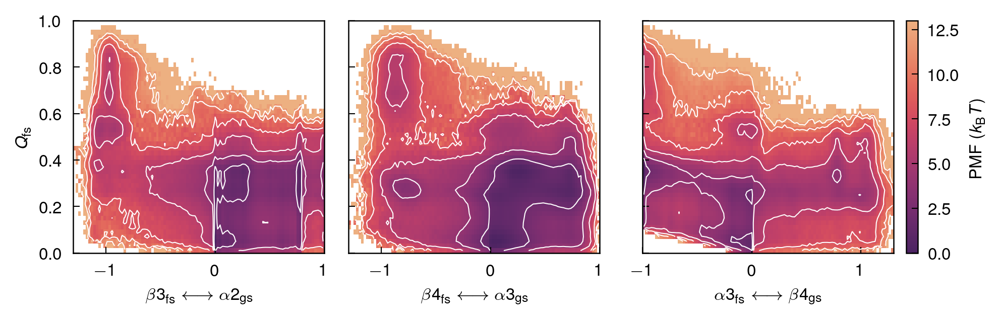

In [29]:
# plot PMFs of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

ye = np.linspace(*lims["q_fs_all"], 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

for ax, cv in zip(axes, ["orange", "green", "blue"]):
    xe = np.linspace(*lims[cv], 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(
        cvs[cv], q_fs_all, np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
    )
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    # ax.plot(np.array(cv)[in_gs][::100], np.array(q_core)[in_gs][::100], ".", alpha=0.1, color="k")
    # ax.plot(np.array(cv)[in_fs][::100], np.array(q_core)[in_fs][::100], ".", alpha=0.1, color="b")
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(labels["q_fs_all"])
    ax.set_xlabel(labels[cv])
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label=r"PMF ($k_{\mathrm{B}}T$)", location="right")

/project/dinner/scguo/extq/src/extq/projection.py:145: RuntimeWarning: invalid value encountered in divide
  return numer / denom


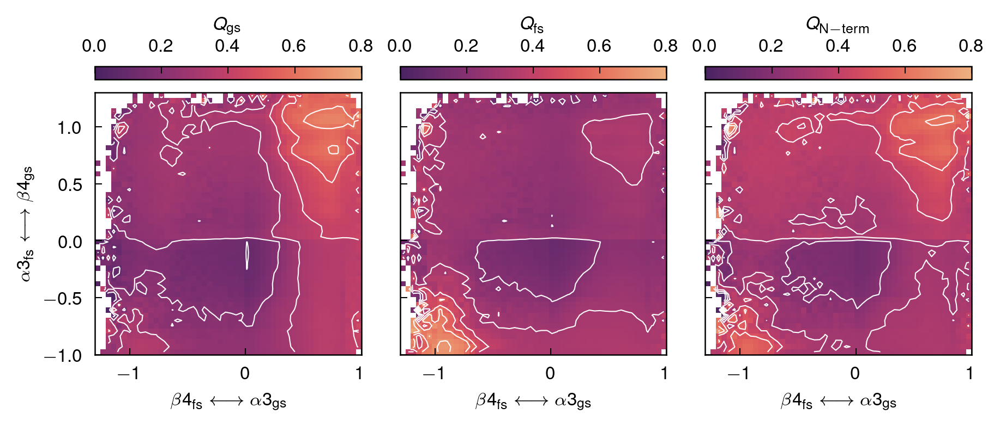

In [30]:
# plot averages of different cvs
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(6, 2.5), sharex=True, sharey=True, dpi=300, constrained_layout=True
)

cv1, cv2 = "green", "blue"
xe = np.linspace(*lims[cv1], 51)
ye = np.linspace(*lims[cv2], 51)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2
clines = np.linspace(0, 0.7, 8)

for ax, cv in zip(axes, ["q_gs_all", "q_fs_all", "q_core"]):
    hist = extq.projection.average2d(
        cvs[cv1], cvs[cv2], cvs[cv], np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
    )
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="flare_r", rasterized=True, vmin=0, vmax=0.8)
    ax.contour(xc, yc, hist.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_xlabel(labels[cv1])
    ax.set_ylabel(labels[cv2])
    ax.label_outer()
    cb = plt.colorbar(pc, ax=ax, label=labels[cv], location="top")

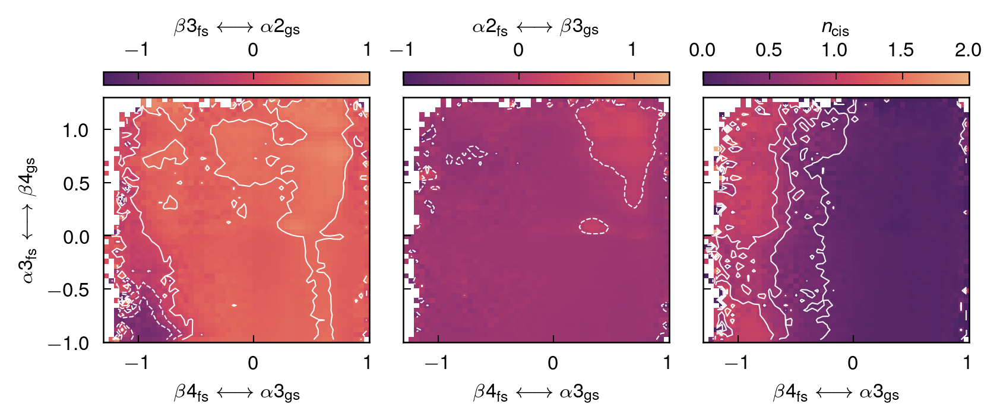

In [31]:
# plot averages of different cvs
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(5.5, 2.25), sharex=True, sharey=True, dpi=300, constrained_layout=True
)

cv1, cv2 = "green", "blue"
xe = np.linspace(*lims[cv1], 51)
ye = np.linspace(*lims[cv2], 51)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2


for ax, cv in zip(axes, ["orange", "c0", "n_cis"]):
    clines = np.linspace(*lims[cv], 8)
    hist = extq.projection.average2d(
        cvs[cv1], cvs[cv2], cvs[cv], np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
    )
    pc = ax.pcolormesh(xc, yc, hist.T, cmap="flare_r", rasterized=True, vmin=lims[cv][0], vmax=lims[cv][1])
    ax.contour(xc, yc, hist.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_xlabel(labels[cv1])
    ax.set_ylabel(labels[cv2])
    ax.label_outer()
    cb = plt.colorbar(pc, ax=ax, label=labels[cv], location="top")

/scratch/local/jobs/15766754/ipykernel_1582212/326009941.py:9: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15766754/ipykernel_1582212/326009941.py:10: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


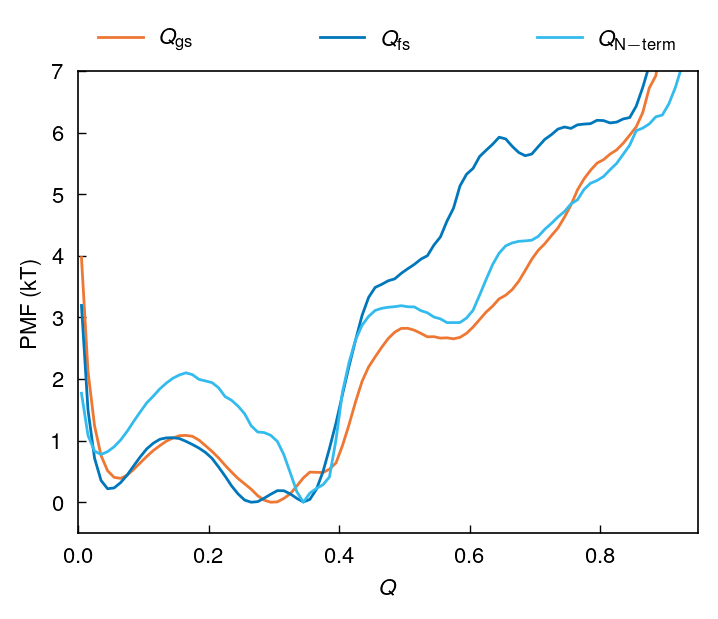

In [32]:
# 1D PMFs
linestyles = ["-", "--", "-", "--"]
xe = np.linspace(*lims["q_core"], 101)
xc = (xe[:-1] + xe[1:]) / 2

f, ax = plt.subplots(figsize=(4, 3), dpi=200)
for cv in ["q_gs_all", "q_fs_all", "q_core"]:
    hist = extq.projection.density1d(cvs[cv], np.broadcast_to(sample_w[..., None], q_gs.shape), xe)
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    ax.plot(xc, pmf, label=labels[cv], lw=1)
ax.set_xlim([0, 0.95])
ax.set_ylim([-0.5, 7])
ax.set_xlabel("$Q$")
ax.set_ylabel("PMF (kT)")
pplt.legend(outside="top")

## distributions for states

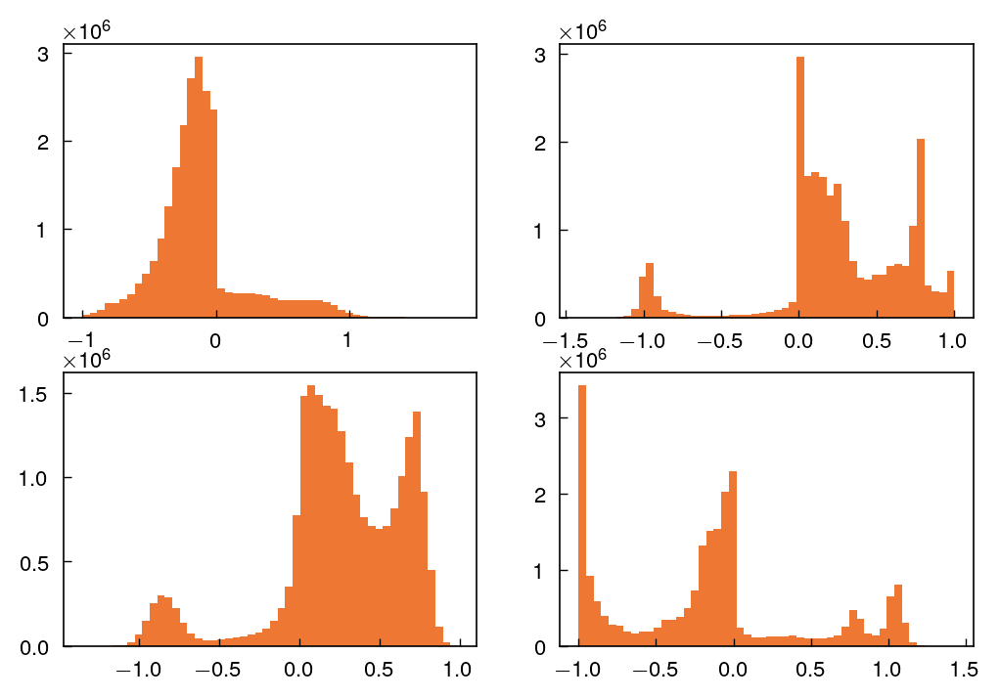

In [33]:
f, axes = plt.subplots(2, 2, figsize=(6, 4), dpi=200)
for c, ax in zip((c_0, c_orange, c_green, c_blue), axes.flat):
    ax.hist(np.ravel(c), bins=50)

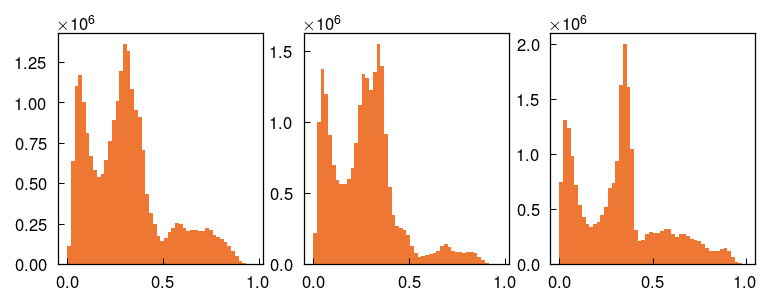

In [34]:
f, axes = plt.subplots(1, 3, figsize=(6, 2))
for c, ax in zip((q_gs_all, q_fs_all, q_core), axes.flat):
    ax.hist(np.ravel(c), bins=50)

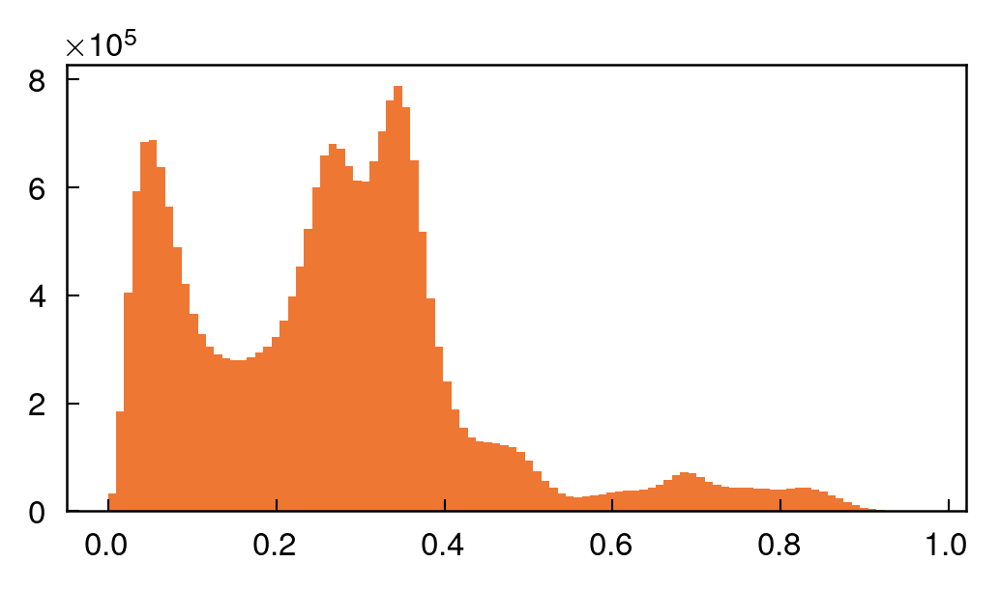

In [35]:
fig = plt.figure(dpi=300, figsize=(4, 2))
_ = plt.hist(np.ravel(q_fs_all), bins=100)

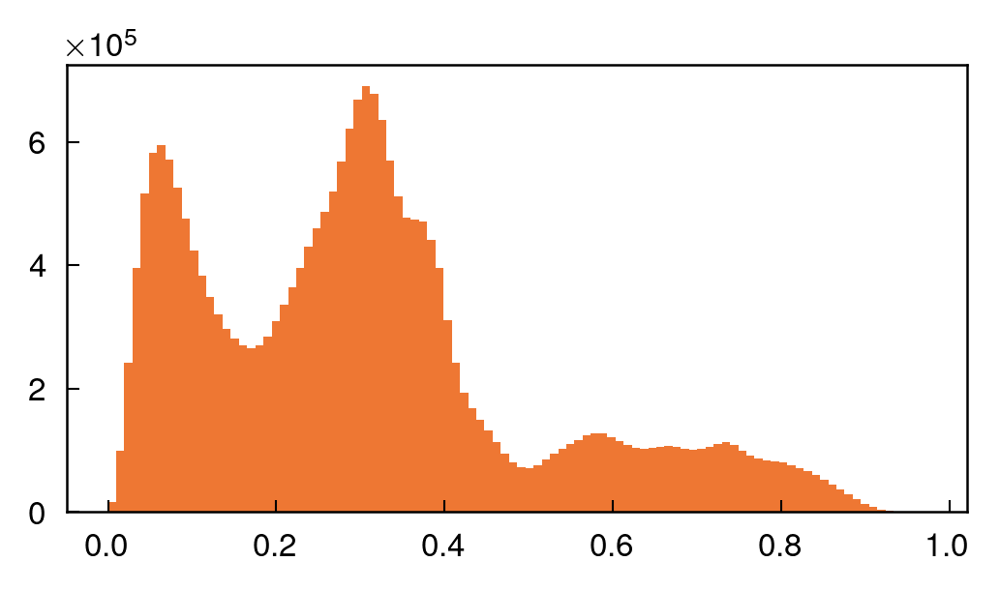

In [36]:
fig = plt.figure(dpi=300, figsize=(4, 2))
_ = plt.hist(np.ravel(q_gs_all), bins=100)

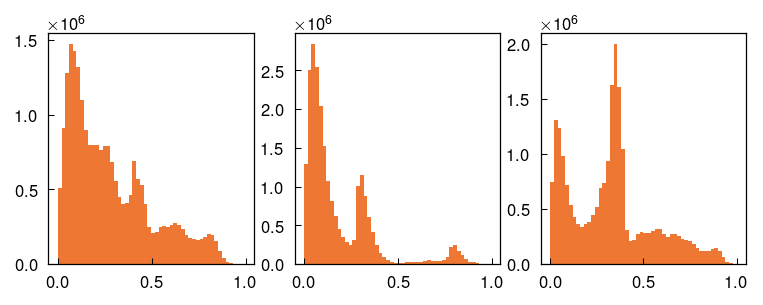

In [37]:
f, axes = plt.subplots(1, 3, figsize=(6, 2))
for c, ax in zip((q_gs, q_fs, q_core), axes.flat):
    ax.hist(np.ravel(c), bins=50)

## state definitions

In [179]:
in_fs = (c_green < -0.65) & (c_blue < -0.8) & (c_orange < -0.85) & (q_fs_all > 0.61) & (q_fs > 0.75) & (f_rmsds < 0.35)
in_gs = (c_green > 0.55) & (c_blue > 0.90) & (c_orange > 0.75) & (q_gs_all > 0.62) & (q_gs > 0.7) & (p_rmsds < 0.45)

In [180]:
total_N = np.prod(q_gs_all.shape)
print(np.count_nonzero(in_fs), np.count_nonzero(in_gs))
print(np.count_nonzero(in_fs) / total_N * 100, np.count_nonzero(in_gs) / total_N * 100)

783922 870872
3.40658080446675 3.78442732612118


In [40]:
(np.nonzero(in_fs)[0][:20], np.nonzero(in_fs)[1][:20])

(array([3072, 3072, 3072, 3072, 3072, 3072, 3072, 3072, 3072, 3072, 3072,
        3072, 3072, 3072, 3072, 3072, 3072, 3072, 3072, 3072]),
 array([10, 12, 14, 22, 25, 30, 31, 34, 35, 36, 37, 38, 39, 40, 42, 44, 45,
        46, 47, 49]))

In [41]:
traj_files[3072]

'/project/dinner/scguo/kaiB/dga/new_91/01/01537/cis/fs_p2.5_00_00.run.h5'

In [42]:
traj = md.load(traj_files[3072])

/beagle3/dinner/scguo/envs/md/lib/python3.11/site-packages/mdtraj/core/trajectory.py:439: UserWarning: top= kwargs ignored since this file parser does not support it
  warnings.warn('top= kwargs ignored since this file parser does not support it')


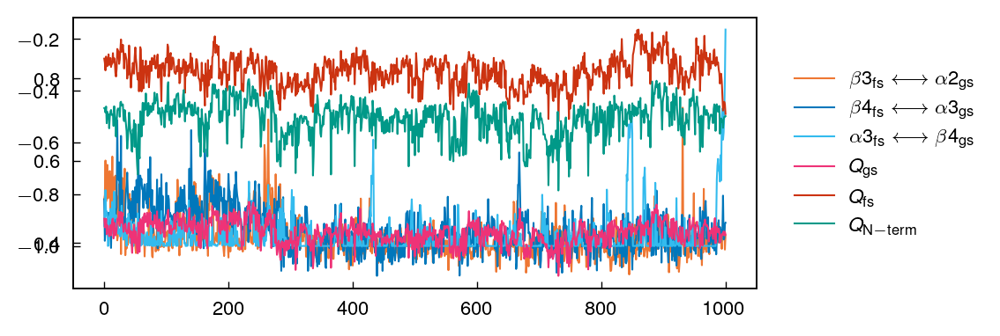

In [43]:
fig = plt.figure(figsize=(5, 2), dpi=200)
ax = plt.gca()
ax2 = plt.twinx()
for cv in ["orange", "green", "blue"]:
    ax.plot(cvs[cv][3072], label=labels[cv])
for i, cv in enumerate(["q_gs_all", "q_fs_all", "q_core"]):
    ax2.plot(cvs[cv][3072], label=labels[cv], color=f"C{i+3}")
pplt.legend(outside="right", axs=(ax, ax2))
# plt.ylim([-0.3, 1.3])

In [1]:
traj.save_xtc(os.path.join(os.path.dirname(traj_files[3072]), "traj.xtc"))

NameError: name 'traj' is not defined

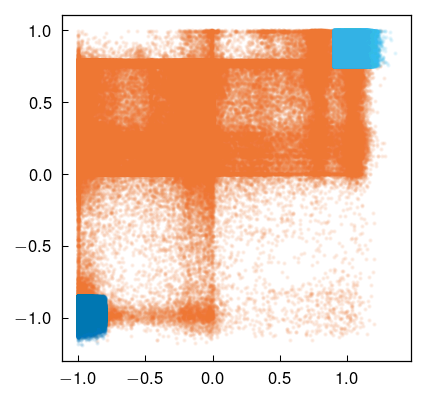

In [181]:
cv1, cv2 = c_blue, c_orange
plt.plot(np.concatenate(cv1)[::100], np.concatenate(cv2)[::100], ".", alpha=0.1)
plt.plot(np.ravel(cv1[in_fs]), np.ravel(cv2[in_fs]), ".", alpha=0.1)
plt.plot(np.ravel(cv1[in_gs]), np.ravel(cv2[in_gs]), ".", alpha=0.1)

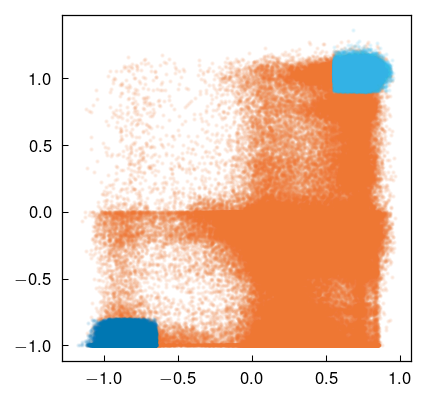

In [182]:
plt.plot(np.concatenate(c_green)[::100], np.concatenate(c_blue)[::100], ".", alpha=0.1)
plt.plot(np.ravel(c_green[in_fs])[::10], np.ravel(c_blue[in_fs])[::10], ".", alpha=0.1)
plt.plot(np.ravel(c_green[in_gs])[::10], np.ravel(c_blue[in_gs])[::10], ".", alpha=0.1)

In [183]:
for p, num in zip([p63_cis, p70_cis, p71_cis, p72_cis], [63, 70, 71, 72]):
    print(f"P{num}: fs {np.count_nonzero(p[in_fs]) / np.count_nonzero(in_fs) * 100:.1f}% cis")
    print(f"P{num}: gs {np.count_nonzero(p[in_gs]) / np.count_nonzero(in_gs) * 100:.1f}% cis")

P63: fs 17.2% cis
P63: gs 0.0% cis
P70: fs 20.5% cis
P70: gs 0.0% cis
P71: fs 71.5% cis
P71: gs 0.0% cis
P72: fs 1.7% cis
P72: gs 0.8% cis


In [184]:
np.mean(n_cis[in_fs]), np.mean(n_cis[in_gs])

(1.107931656465822, 0.008771667937423639)

/scratch/local/jobs/15766754/ipykernel_1582212/4265096874.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15766754/ipykernel_1582212/4265096874.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


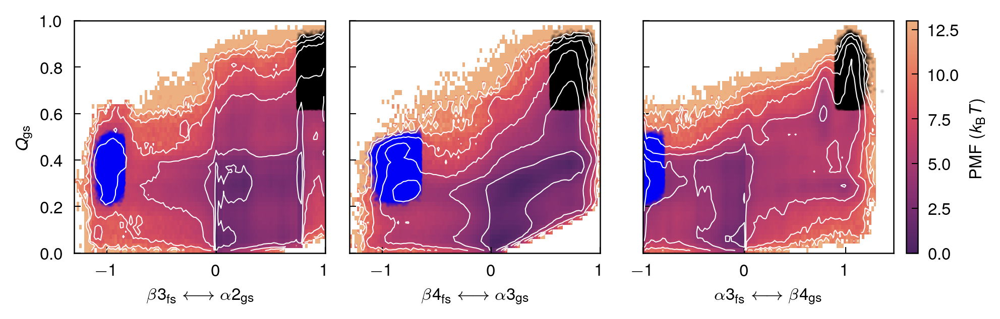

In [185]:
# plot PMFs of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

ye = np.linspace(*lims["q_gs_all"], 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

for ax, cv in zip(axes, ["orange", "green", "blue"]):
    xe = np.linspace(*lims[cv], 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(
        cvs[cv], q_gs_all, np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
    )
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.plot(np.ravel(cvs[cv][in_gs])[::10], np.ravel(q_gs_all[in_gs])[::10], ".", alpha=0.1, color="k")
    ax.plot(np.ravel(cvs[cv][in_fs])[::10], np.ravel(q_gs_all[in_fs])[::10], ".", alpha=0.1, color="b")
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(labels["q_gs_all"])
    ax.set_xlabel(labels[cv])
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label=r"PMF ($k_{\mathrm{B}}T$)", location="right")

/scratch/local/jobs/15766754/ipykernel_1582212/2230352734.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15766754/ipykernel_1582212/2230352734.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


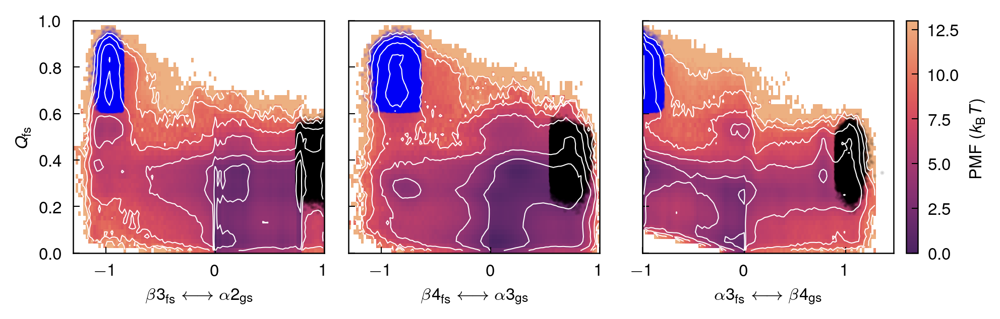

In [186]:
# plot PMFs of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

ye = np.linspace(*lims["q_fs_all"], 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

for ax, cv in zip(axes, ["orange", "green", "blue"]):
    xe = np.linspace(*lims[cv], 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(
        cvs[cv], q_fs_all, np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
    )
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.plot(np.ravel(cvs[cv][in_gs])[::10], np.ravel(q_fs_all[in_gs])[::10], ".", alpha=0.1, color="k")
    ax.plot(np.ravel(cvs[cv][in_fs])[::10], np.ravel(q_fs_all[in_fs])[::10], ".", alpha=0.1, color="b")
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(labels["q_fs_all"])
    ax.set_xlabel(labels[cv])
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label=r"PMF ($k_{\mathrm{B}}T$)", location="right")

/scratch/local/jobs/15766754/ipykernel_1582212/3365035823.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15766754/ipykernel_1582212/3365035823.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


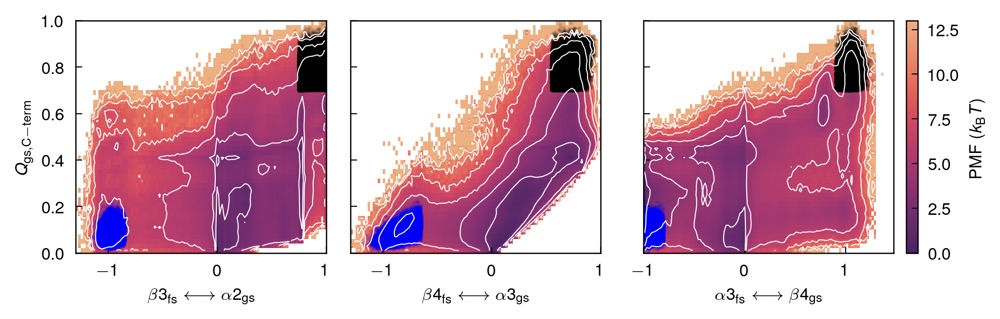

In [187]:
# plot PMFs of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

ye = np.linspace(*lims["q_gs_all"], 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

for ax, cv in zip(axes, ["orange", "green", "blue"]):
    xe = np.linspace(*lims[cv], 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(
        cvs[cv], q_gs, np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
    )
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.plot(np.ravel(cvs[cv][in_gs])[::10], np.ravel(q_gs[in_gs])[::10], ".", alpha=0.1, color="k")
    ax.plot(np.ravel(cvs[cv][in_fs])[::10], np.ravel(q_gs[in_fs])[::10], ".", alpha=0.1, color="b")
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$Q_{\mathrm{gs, C-term}}$")
    ax.set_xlabel(labels[cv])
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label=r"PMF ($k_{\mathrm{B}}T$)", location="right")

/scratch/local/jobs/15766754/ipykernel_1582212/2374143287.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15766754/ipykernel_1582212/2374143287.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


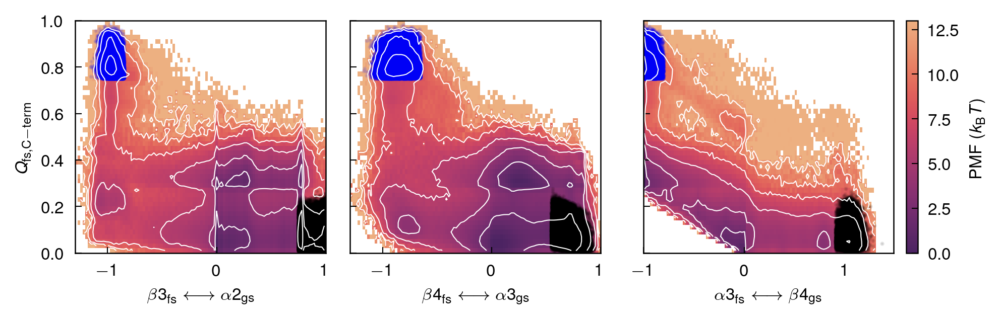

In [188]:
# plot PMFs of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

ye = np.linspace(*lims["q_fs_all"], 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

for ax, cv in zip(axes, ["orange", "green", "blue"]):
    xe = np.linspace(*lims[cv], 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(
        cvs[cv], q_fs, np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
    )
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.plot(np.ravel(cvs[cv][in_gs])[::10], np.ravel(q_fs[in_gs])[::10], ".", alpha=0.1, color="k")
    ax.plot(np.ravel(cvs[cv][in_fs])[::10], np.ravel(q_fs[in_fs])[::10], ".", alpha=0.1, color="b")
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$Q_{\mathrm{fs, C-term}}$")
    ax.set_xlabel(labels[cv])
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label=r"PMF ($k_{\mathrm{B}}T$)", location="right")

/scratch/local/jobs/15766754/ipykernel_1582212/1578849151.py:14: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(hist))
/scratch/local/jobs/15766754/ipykernel_1582212/1578849151.py:15: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - offset


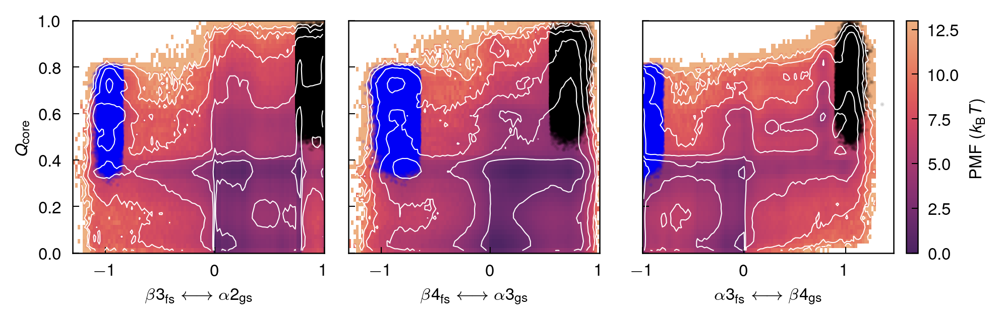

In [189]:
# plot PMFs of different cvs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.5, 2), dpi=300, constrained_layout=True)

ye = np.linspace(*lims["q_core"], 51)
yc = (ye[1:] + ye[:-1]) / 2
clines = np.arange(0, 13, 2)

for ax, cv in zip(axes, ["orange", "green", "blue"]):
    xe = np.linspace(*lims[cv], 101)
    xc = (xe[1:] + xe[:-1]) / 2
    hist = extq.projection.density2d(
        cvs[cv], q_core, np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye
    )
    offset = np.min(-np.log(hist))
    pmf = -np.log(hist) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.plot(np.ravel(cvs[cv][in_gs])[::10], np.ravel(q_core[in_gs])[::10], ".", alpha=0.1, color="k")
    ax.plot(np.ravel(cvs[cv][in_fs])[::10], np.ravel(q_core[in_fs])[::10], ".", alpha=0.1, color="b")
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_ylabel(r"$Q_{\mathrm{core}}$")
    ax.set_xlabel(labels[cv])
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[-1], label=r"PMF ($k_{\mathrm{B}}T$)", location="right")

# features for MSM building

In [54]:
from itertools import product

In [55]:
gs_file = f"/project/dinner/scguo/kaiB/dga/new_91/00/00001/cis/gs_p2.5_00_00.run.h5"
gs_traj = md.load(gs_file)

featurizer = pyemma.coordinates.featurizer(gs_traj.top)

In [56]:
# fmt: off
resids = np.array([3, 9, 11, 13, 16, 23, 33, 38, 41, 43, 45, 47, 51, 56, 59, 63, 65, 67, 70, 72, 75, 78, 81, 84, 87, 90, 93,]) - 1
# fmt: on
residue_pairs = [(i, j) for (i, j) in product(resids, resids) if abs(i - j) > 3 and i > j]
featurizer.add_residue_mindist(residue_pairs=residue_pairs, threshold=0.45)

print(np.count_nonzero(featurizer.describe()))

332


In [57]:
# raw_contacts = pyemma.coordinates.load(traj_files, features=featurizer, chunksize=128)

In [58]:
def save_blocks(arrays, basename, block_size=2000):
    n_blocks = len(arrays) // block_size + 1
    for i in range(n_blocks):
        if i != n_blocks - 1:
            block = arrays[i * block_size : (i + 1) * block_size]
        else:
            block = arrays[i * block_size :]
        print(len(block), block[0].shape, i)
        np.save(f"{basename}_{i:02}.npy", block)

In [59]:
# save_blocks(raw_contacts, f"{data_dir}/raw_contacts")

In [60]:
raw_contacts = load_cv(f"{data_dir}/raw_contacts")

In [61]:
raw_contacts.shape

(22989, 1001, 332)

## filtering contacts

In [62]:
feature_occupancy = np.mean(raw_contacts, axis=(0, 1))

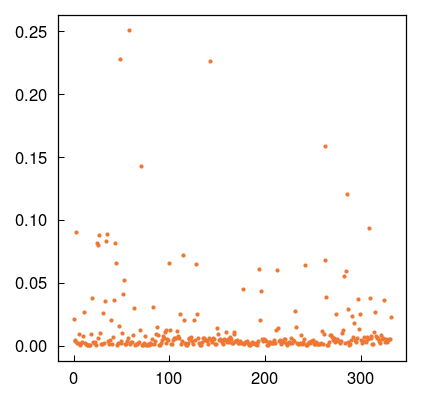

In [63]:
plt.plot(feature_occupancy, ".")

37
RES_DIST (closest-heavy) TYR12 - VAL8
RES_DIST (closest-heavy) GLY37 - VAL8
RES_DIST (closest-heavy) GLY37 - GLU32
RES_DIST (closest-heavy) ALA40 - VAL8
RES_DIST (closest-heavy) ALA40 - LYS10
RES_DIST (closest-heavy) LYS42 - VAL8
RES_DIST (closest-heavy) LYS42 - LYS10
RES_DIST (closest-heavy) LYS42 - TYR12
RES_DIST (closest-heavy) ILE44 - LYS10
RES_DIST (closest-heavy) ILE44 - TYR12
RES_DIST (closest-heavy) ILE44 - GLY15
RES_DIST (closest-heavy) ILE44 - ALA40
RES_DIST (closest-heavy) VAL46 - TYR12
RES_DIST (closest-heavy) VAL46 - GLY15
RES_DIST (closest-heavy) VAL46 - LYS42
RES_DIST (closest-heavy) PRO50 - GLY15
RES_DIST (closest-heavy) PRO50 - VAL46
RES_DIST (closest-heavy) GLU55 - PRO50
RES_DIST (closest-heavy) CPR62 - TYR12
RES_DIST (closest-heavy) LEU64 - LYS10
RES_DIST (closest-heavy) LYS66 - VAL8
RES_DIST (closest-heavy) LYS66 - CPR62
RES_DIST (closest-heavy) CPR71 - LYS66
RES_DIST (closest-heavy) ARG74 - LEU64
RES_DIST (closest-heavy) ARG74 - CPR69
RES_DIST (closest-heavy) GL

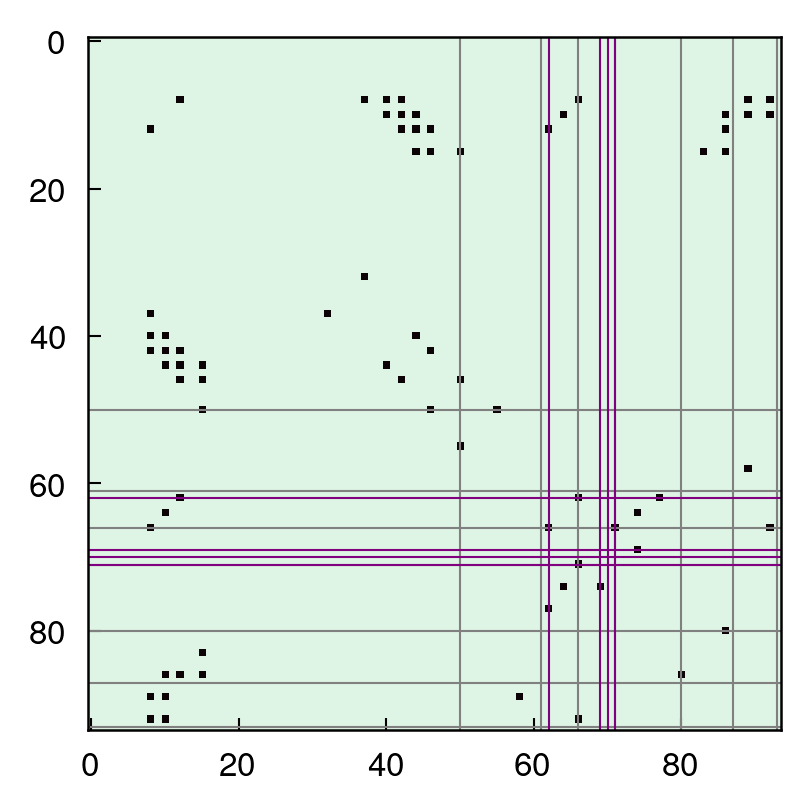

In [64]:
OCCUPANCY_CUTOFF = 0.03
print(np.count_nonzero(feature_occupancy > OCCUPANCY_CUTOFF))
for contact_id in np.nonzero(feature_occupancy > OCCUPANCY_CUTOFF)[0]:
    print(featurizer.describe()[contact_id])

fig = plt.figure(dpi=300)
ax = plt.gca()
boundaries_gs = [50, 61, 66, 71, 80, 87, 93]
boundaries_fs = [50, 63, 68, 72, 76, 83, 93]
prolines = [62, 69, 70, 71]
contact_map = np.zeros([94, 94], dtype=int)
contact_ids = np.nonzero(feature_occupancy > OCCUPANCY_CUTOFF)[0]
for contact_id in contact_ids:
    feature = featurizer.describe()[contact_id]
    words = feature.split()
    res1, res2 = words[2], words[4]
    # print(res1, res2)
    resid1, resid2 = int(res1[3:]), int(res2[3:])
    contact_map[resid1, resid2] = 1
    contact_map[resid2, resid1] = 1
ax.imshow(contact_map, cmap="mako_r")
for b in boundaries_gs:
    ax.axhline(b, color="gray", lw=0.5)
    ax.axvline(b, color="gray", lw=0.5)
for p in prolines:
    ax.axhline(p, color="purple", lw=0.5)
    ax.axvline(p, color="purple", lw=0.5)

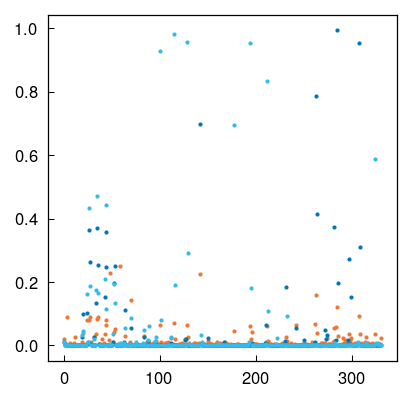

In [65]:
gs_occupancy = np.mean(raw_contacts[in_gs], axis=0)
fs_occupancy = np.mean(raw_contacts[in_fs], axis=0)
plt.plot(feature_occupancy, ".")
plt.plot(gs_occupancy, ".")
plt.plot(fs_occupancy, ".")

In [66]:
CONTACT_CUTOFF = 0.1
print("gs contacts")
gs_contact_ids = set(np.nonzero(gs_occupancy > CONTACT_CUTOFF)[0])
print(np.count_nonzero(gs_occupancy > CONTACT_CUTOFF))
for contact_id in np.nonzero(gs_occupancy > CONTACT_CUTOFF)[0]:
    print(featurizer.describe()[contact_id])
print("\nfs contacts")
fs_contact_ids = set(np.nonzero(fs_occupancy > CONTACT_CUTOFF)[0])
print(np.count_nonzero(fs_occupancy > CONTACT_CUTOFF))
for contact_id in np.nonzero(fs_occupancy > CONTACT_CUTOFF)[0]:
    print(featurizer.describe()[contact_id])

gs contacts
23
RES_DIST (closest-heavy) GLY37 - GLU32
RES_DIST (closest-heavy) ALA40 - VAL8
RES_DIST (closest-heavy) ALA40 - LYS10
RES_DIST (closest-heavy) LYS42 - VAL8
RES_DIST (closest-heavy) LYS42 - LYS10
RES_DIST (closest-heavy) LYS42 - TYR12
RES_DIST (closest-heavy) ILE44 - LYS10
RES_DIST (closest-heavy) ILE44 - TYR12
RES_DIST (closest-heavy) ILE44 - GLY15
RES_DIST (closest-heavy) VAL46 - TYR12
RES_DIST (closest-heavy) VAL46 - GLY15
RES_DIST (closest-heavy) PRO50 - GLY15
RES_DIST (closest-heavy) LYS66 - CPR62
RES_DIST (closest-heavy) SER80 - ILE58
RES_DIST (closest-heavy) LEU86 - TYR12
RES_DIST (closest-heavy) LEU86 - GLY15
RES_DIST (closest-heavy) LEU86 - SER80
RES_DIST (closest-heavy) LEU89 - LYS10
RES_DIST (closest-heavy) LEU89 - TYR12
RES_DIST (closest-heavy) LEU89 - ILE58
RES_DIST (closest-heavy) LEU89 - LEU64
RES_DIST (closest-heavy) LEU92 - VAL8
RES_DIST (closest-heavy) LEU92 - LYS10

fs contacts
22
RES_DIST (closest-heavy) GLY37 - GLU32
RES_DIST (closest-heavy) ALA40 - VAL

In [67]:
# combine all contacts
union_contact_ids = (
    gs_contact_ids | fs_contact_ids | set(np.nonzero(feature_occupancy > OCCUPANCY_CUTOFF)[0])
)
print(len(union_contact_ids))

44


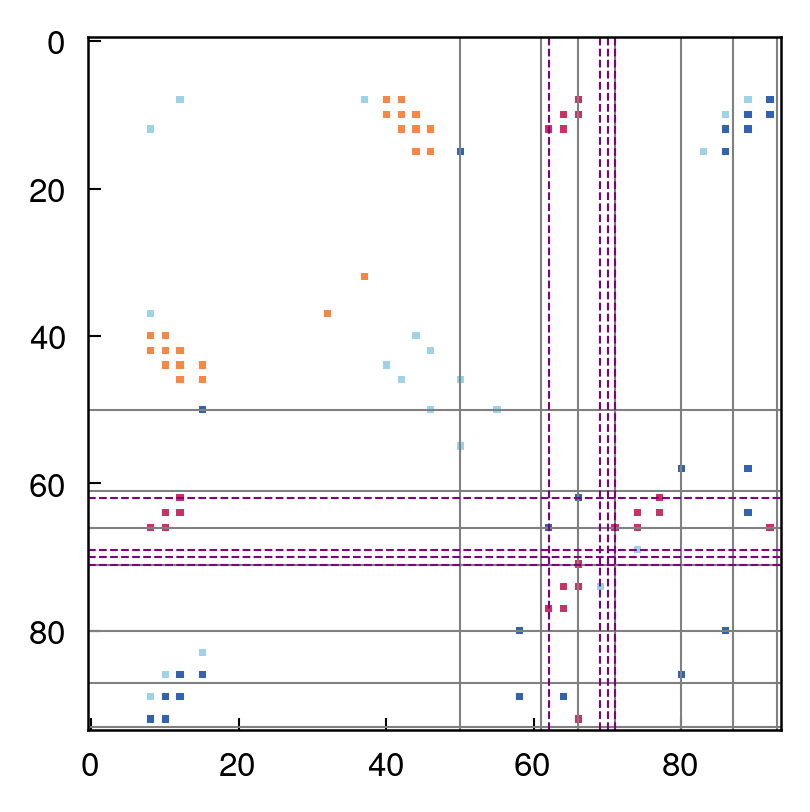

In [68]:
fig = plt.figure(dpi=300)
ax = plt.gca()
boundaries_gs = [50, 61, 66, 71, 80, 87, 93]
boundaries_fs = [50, 63, 68, 72, 76, 83, 93]
prolines = [62, 69, 70, 71]
contact_map = np.full([94, 94], np.nan)
for contact_id in union_contact_ids:
    feature = featurizer.describe()[contact_id]
    words = feature.split()
    res1, res2 = words[2], words[4]
    # print(res1, res2)
    resid1, resid2 = int(res1[3:]), int(res2[3:])
    if (contact_id in gs_contact_ids) and not (contact_id in fs_contact_ids):
        value = 1
    elif (contact_id in fs_contact_ids) and not (contact_id in gs_contact_ids):
        value = 2
    elif (contact_id in fs_contact_ids) and (contact_id in gs_contact_ids):
        value = 3
    else:
        value = 4
    contact_map[resid1, resid2] = value
    contact_map[resid2, resid1] = value
ax.imshow(contact_map, cmap="pastel5")
for b in boundaries_gs:
    ax.axhline(b, color="gray", lw=0.5)
    ax.axvline(b, color="gray", lw=0.5)
for p in prolines:
    ax.axhline(p, color="purple", lw=0.5, ls="--")
    ax.axvline(p, color="purple", lw=0.5, ls="--")

# dimensionality reduction and clustering

In [69]:
print(union_contact_ids)

{128, 129, 3, 262, 263, 264, 142, 19, 24, 282, 26, 27, 285, 286, 284, 33, 34, 35, 297, 42, 43, 44, 299, 48, 177, 52, 53, 308, 309, 58, 63, 194, 195, 324, 196, 70, 83, 212, 213, 100, 231, 114, 115, 242}


In [70]:
# load raw distances
raw_contact_ds = load_cv(f"{data_dir}/contact_dists")[..., np.array(list(union_contact_ids))]

In [71]:
print(raw_contact_ds.shape)

(22989, 1001, 44)


In [72]:
means, stds = [], []
for i in range(raw_contact_ds.shape[-1]):
    means.append(np.mean(raw_contact_ds[..., i]))
    stds.append(np.std(raw_contact_ds[..., i]))

<ErrorbarContainer object of 3 artists>

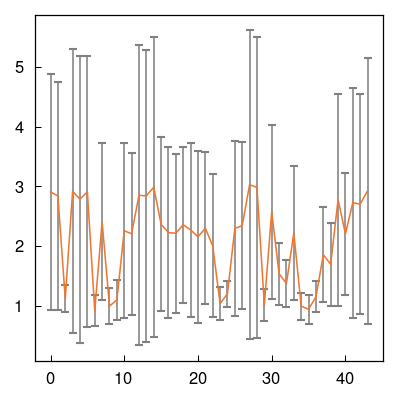

In [73]:
plt.errorbar(range(len(means)), means, yerr=stds, capsize=2, ecolor="grey")

## IVAC

### on filtered distances

In [ ]:
memory = Memory(data_dir)

In [ ]:
# IVAC
@memory.cache
def compute_ivac(trajs, minlag, maxlag, nevecs, **kwargs):
    ivac_obj = ivac.LinearIVAC(minlag, maxlag, nevecs=nevecs, **kwargs)
    ivac_obj.fit(trajs)
    ivac_trajs = ivac_obj.transform(trajs)
    return ivac_obj, ivac_trajs

In [75]:
minlag, maxlag = 1, 200
nevecs = 5
ivac_obj, ivac_trajs = compute_ivac(raw_contact_ds, minlag, maxlag, nevecs, adjust=True)

________________________________________________________________________________
[Memory] Calling __main__--scratch-local-jobs-15766754-ipykernel-1782759482.compute_ivac...
compute_ivac(array([[[1.473908, ..., 0.519167],
        ...,
        [1.787436, ..., 0.494827]],

       ...,

       [[6.150638, ..., 4.693075],
        ...,
        [1.796111, ..., 2.36332 ]]], dtype=float32), 
1, 200, 5, adjust=True)
____________________________________________________compute_ivac - 59.7s, 1.0min


/scratch/local/jobs/15766754/ipykernel_1582212/1289938571.py:3: UserWarning: Persisting input arguments took 9.76s to run.If this happens often in your code, it can cause performance problems (results will be correct in all cases). The reason for this is probably some large input arguments for a wrapped function.
  ivac_obj, ivac_trajs = compute_ivac(raw_contact_ds, minlag, maxlag, nevecs, adjust=True)


[28242.30641228  1398.72566384   434.23069738   238.46730481
   200.69251181   154.47509399   122.1680752    104.44840444
    68.02785014    58.59347153]


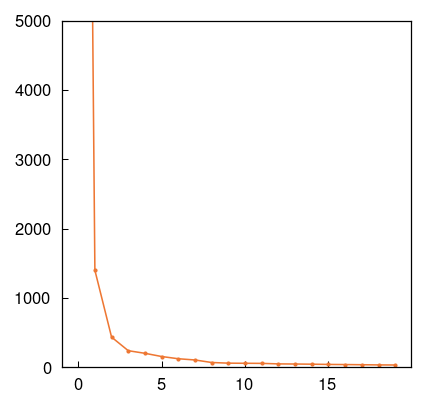

In [76]:
plt.plot(ivac_obj.its[:20], ".-")
plt.ylim([0, 5000])
print(ivac_obj.its[:10])

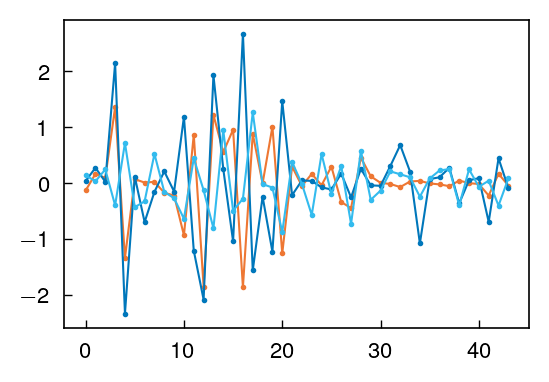

In [77]:
fig = plt.figure(dpi=200, figsize=(3, 2))
plt.plot(ivac_obj.evecs[:, 1:4], ".-")

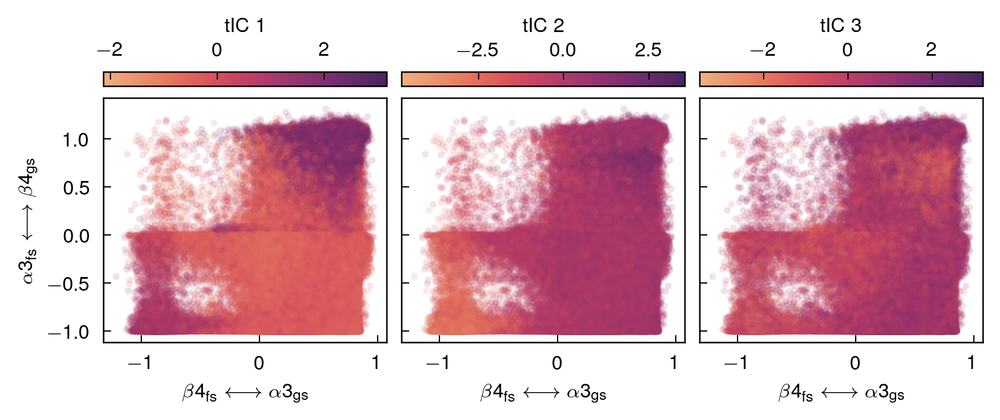

In [78]:
# plot projections
skip = 100
inds = random.sample(range(total_N), total_N // skip)

fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(5.5, 2.25), sharex=True, sharey=True, dpi=300, constrained_layout=True
)

cv1, cv2 = "green", "blue"

for i, ax in enumerate(axes):
    sc = ax.scatter(
        np.ravel(cvs[cv1])[inds],
        np.ravel(cvs[cv2])[inds],
        c=np.concatenate(ivac_trajs)[inds, i + 1],
        cmap="flare",
        alpha=0.1,
    )
    ax.set_xlabel(labels[cv1])
    ax.set_ylabel(labels[cv2])
    ax.label_outer()
    cb = plt.colorbar(sc, ax=ax, label=f"tIC {i + 1}", location="top")
    cb.solids.set(alpha=1)

[None]

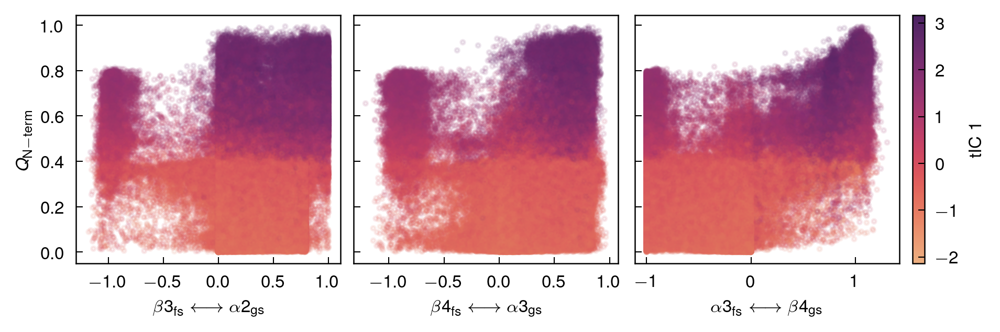

In [79]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.25, 2), dpi=300, constrained_layout=True)
for ax, cv in zip(axes, ["orange", "green", "blue"]):
    sc = ax.scatter(
        np.ravel(cvs[cv])[inds],
        np.ravel(q_core)[inds],
        c=np.concatenate(ivac_trajs)[inds, 1],
        cmap="flare",
        alpha=0.1,
    )
    ax.set_xlabel(labels[cv])
    ax.set_ylabel(labels["q_core"])
    ax.label_outer()
cb = plt.colorbar(sc, ax=axes[-1], label="tIC 1", location="right")
cb.solids.set(alpha=1)

[None]

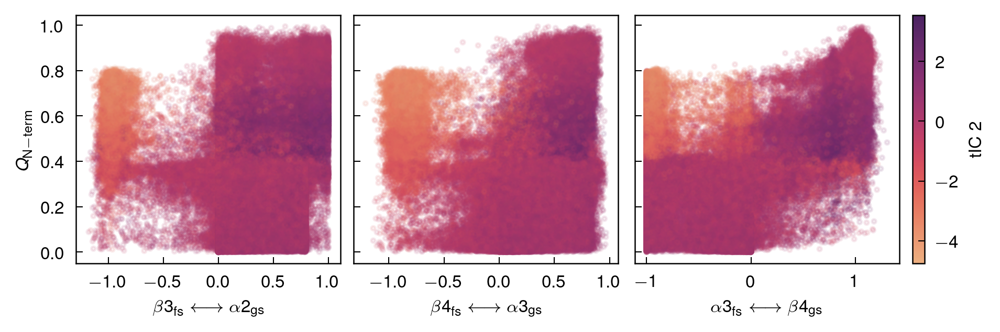

In [80]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.25, 2), dpi=300, constrained_layout=True)
for ax, cv in zip(axes, ["orange", "green", "blue"]):
    sc = ax.scatter(
        np.ravel(cvs[cv])[inds],
        np.ravel(q_core)[inds],
        c=np.concatenate(ivac_trajs)[inds, 2],
        cmap="flare",
        alpha=0.1,
    )
    ax.set_xlabel(labels[cv])
    ax.set_ylabel(labels["q_core"])
    ax.label_outer()
cb = plt.colorbar(sc, ax=axes[-1], label="tIC 2", location="right")
cb.solids.set(alpha=1)

In [81]:
from itertools import combinations

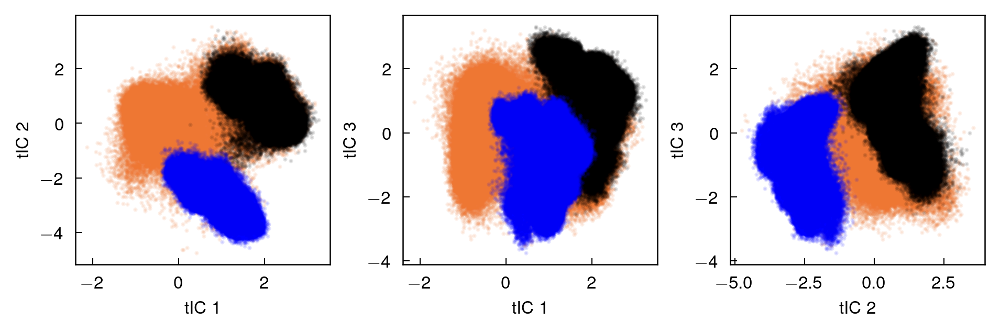

In [82]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.25, 2), dpi=300, constrained_layout=True)
ivac_arr = np.concatenate(ivac_trajs)
in_gs_arr = np.ravel(in_gs)
in_fs_arr = np.ravel(in_fs)
for ax, (i, j) in zip(axes, combinations(range(1, 4), 2)):
    sc = ax.plot(ivac_arr[inds, i], ivac_arr[inds, j], ".", alpha=0.1)
    ax.plot(ivac_arr[in_gs_arr, i], ivac_arr[in_gs_arr, j], ".", color="k", alpha=0.1)
    ax.plot(ivac_arr[in_fs_arr, i], ivac_arr[in_fs_arr, j], ".", color="b", alpha=0.1)
    ax.set_xlabel(f"tIC {i}")
    ax.set_ylabel(f"tIC {j}")

### On 0/1 contacts

In [310]:
# IVAC
ivac_obj = ivac.LinearIVAC(minlag, maxlag, nevecs=5, adjust=True)
ivac_obj.fit(raw_contacts)
ivac_trajs = ivac_obj.transform(raw_contacts)

[3175.3806136  2313.72306101 1127.83545111  584.65085392  569.23670291
  496.61462667  267.69475285  241.38496799  217.7423654   196.47180025]


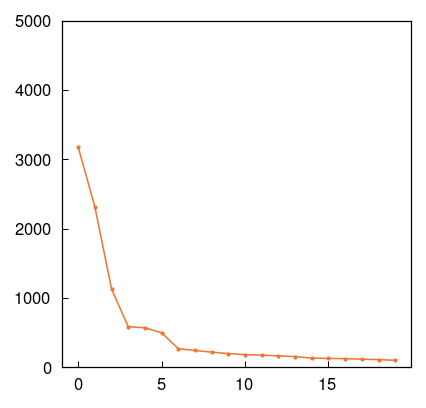

In [311]:
plt.plot(ivac_obj.its[:20], ".-")
plt.ylim([0, 5000])
print(ivac_obj.its[:10])

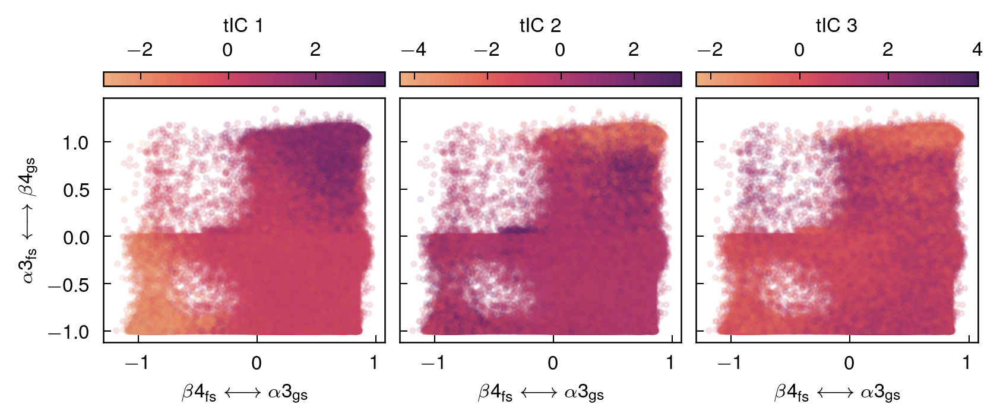

In [312]:
# plot projections
skip = 100
inds = random.sample(range(total_N), total_N // skip)

fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(5.5, 2.25), sharex=True, sharey=True, dpi=300, constrained_layout=True
)

cv1, cv2 = "green", "blue"

for i, ax in enumerate(axes):
    sc = ax.scatter(
        np.ravel(cvs[cv1])[inds],
        np.ravel(cvs[cv2])[inds],
        c=np.concatenate(ivac_trajs)[inds, i + 1],
        cmap="flare",
        alpha=0.1,
    )
    ax.set_xlabel(labels[cv1])
    ax.set_ylabel(labels[cv2])
    ax.label_outer()
    cb = plt.colorbar(sc, ax=ax, label=f"tIC {i + 1}", location="top")
    cb.solids.set(alpha=1)

[None]

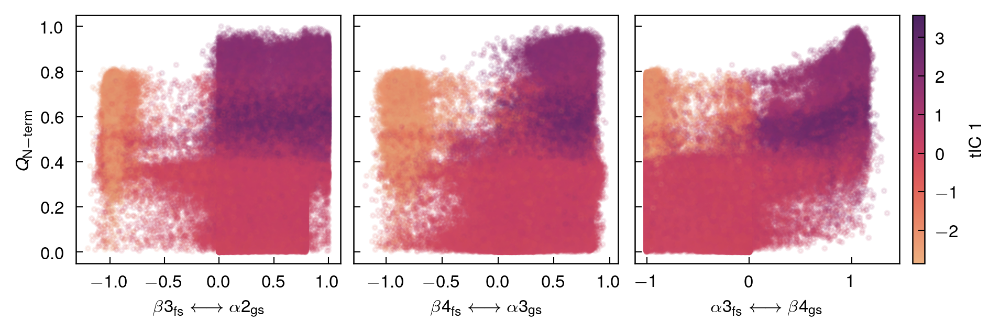

In [313]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.25, 2), dpi=300, constrained_layout=True)
for ax, cv in zip(axes, ["orange", "green", "blue"]):
    sc = ax.scatter(
        np.ravel(cvs[cv])[inds],
        np.ravel(q_core)[inds],
        c=np.concatenate(ivac_trajs)[inds, 1],
        cmap="flare",
        alpha=0.1,
    )
    ax.set_xlabel(labels[cv])
    ax.set_ylabel(labels["q_core"])
    ax.label_outer()
cb = plt.colorbar(sc, ax=axes[-1], label="tIC 1", location="right")
cb.solids.set(alpha=1)

[None]

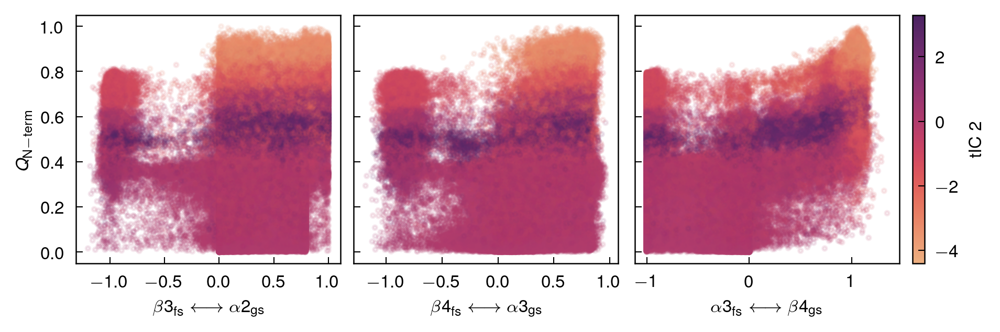

In [314]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.25, 2), dpi=300, constrained_layout=True)
for ax, cv in zip(axes, ["orange", "green", "blue"]):
    sc = ax.scatter(
        np.ravel(cvs[cv])[inds],
        np.ravel(q_core)[inds],
        c=np.concatenate(ivac_trajs)[inds, 2],
        cmap="flare",
        alpha=0.1,
    )
    ax.set_xlabel(labels[cv])
    ax.set_ylabel(labels["q_core"])
    ax.label_outer()
cb = plt.colorbar(sc, ax=axes[-1], label="tIC 2", location="right")
cb.solids.set(alpha=1)

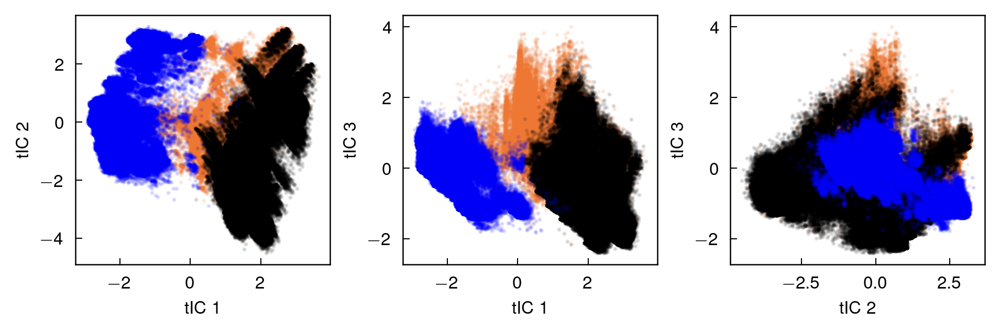

In [315]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(6.25, 2), dpi=300, constrained_layout=True)
ivac_arr = np.concatenate(ivac_trajs)
in_gs_arr = np.ravel(in_gs)
in_fs_arr = np.ravel(in_fs)
for ax, (i, j) in zip(axes, combinations(range(1, 4), 2)):
    sc = ax.plot(ivac_arr[inds, i], ivac_arr[inds, j], ".", alpha=0.1)
    ax.plot(ivac_arr[in_gs_arr, i], ivac_arr[in_gs_arr, j], ".", color="k", alpha=0.1)
    ax.plot(ivac_arr[in_fs_arr, i], ivac_arr[in_fs_arr, j], ".", color="b", alpha=0.1)
    ax.set_xlabel(f"tIC {i}")
    ax.set_ylabel(f"tIC {j}")

## Clustering

In [83]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import pairwise_distances_argmin
from sklearn.neighbors import NearestNeighbors

In [84]:
@memory.cache
def kmeans_cluster(trajs, k=300):
    flattened_trajs = np.concatenate(trajs)
    kmeans_obj = MiniBatchKMeans(n_clusters=k)
    kmeans_obj.fit(flattened_trajs)
    nneighbors = NearestNeighbors(n_neighbors=1)
    nneighbors.fit(kmeans_obj.cluster_centers_)
    dtrajs = nneighbors.kneighbors(flattened_trajs, 1, return_distance=False)
    return dtrajs

### just IVAC coordinats

In [85]:
ivac_trajs[0].shape

(1001, 5)

In [86]:
k = 200
dtrajs0 = kmeans_cluster([traj[:, 1:] for traj in ivac_trajs], k)

________________________________________________________________________________
[Memory] Calling __main__--scratch-local-jobs-15766754-ipykernel-3348954603.kmeans_cluster...
kmeans_cluster([ array([[1.61362 , ..., 0.106047],
       ...,
       [1.529122, ..., 0.231584]]),
  array([[ 1.61362 , ...,  0.106047],
       ...,
       [ 1.453298, ..., -1.919002]]),
  array([[2.013996, ..., 1.42289 ],
       ...,
       [2.069798, ..., 1.130158]]),
  array([[2.013996, ..., 1.42289 ],
       ...,
       [1.466711, ..., 1.914326]]),
  array([[2.375872, ..., 1.585239],
       ...,
       [2.360341, ..., 1.558947]]),
  array([[2.375872, ..., 1.585239],
       ...,
       [2.398627, ..., 1.509915]]),
  array([[2.156611, ..., 1.130741],
       ...,
       [1.895646, ..., 1.361259]]),
  array([[2.156611, ..., 1.130741],
       ...,
       [2.278934, ..., 1.723007]]),
  array([[2.21004 , ...,..., 
200)


/beagle3/dinner/scguo/envs/md/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


________________________________________________kmeans_cluster - 829.0s, 13.8min


/scratch/local/jobs/15766754/ipykernel_1582212/1894520302.py:2: UserWarning: Persisting input arguments took 6.16s to run.If this happens often in your code, it can cause performance problems (results will be correct in all cases). The reason for this is probably some large input arguments for a wrapped function.
  dtrajs0 = kmeans_cluster([traj[:, 1:] for traj in ivac_trajs], k)


In [87]:
dtrajs0.shape

(23011989, 1)

In [88]:
dtrajs0 = dtrajs0.squeeze()

### characterize clusters

In [89]:
# check proline states in clusters
def compute_cluster_average(dtrajs, cv, k=200):
    cv_arr = np.concatenate(cv)
    n_cvs = cv_arr.shape[-1]
    avgs = np.zeros((k, n_cvs))
    stds = np.zeros((k, n_cvs))
    for i in range(k):
        cv_cluster = cv_arr[dtrajs == i]
        avgs[i] = np.mean(cv_cluster, axis=0)
        stds[i] = np.std(cv_cluster, axis=0)
    return avgs, stds

In [90]:
cluster_ncis = compute_cluster_average(dtrajs0, n_cis[..., None], k=k)

<ErrorbarContainer object of 3 artists>

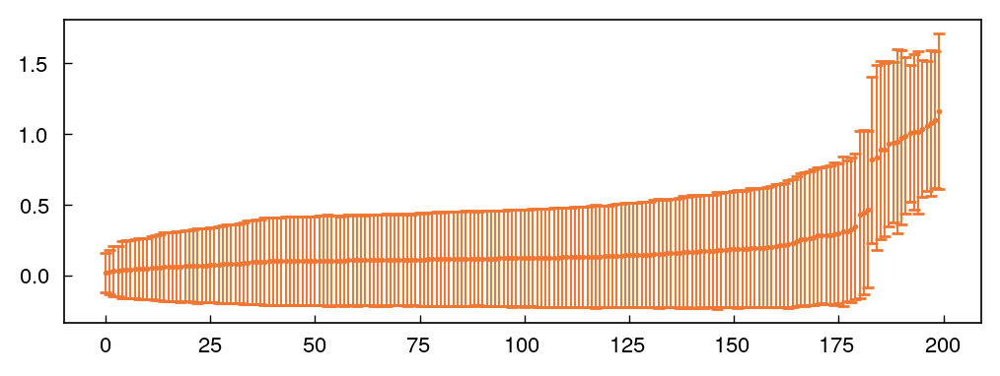

In [91]:
fig = plt.figure(figsize=(6, 2), dpi=200)
sort_ids = np.argsort(cluster_ncis[0].squeeze())
plt.errorbar(
    np.arange(k),
    cluster_ncis[0].squeeze()[sort_ids],
    yerr=cluster_ncis[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)

In [92]:
cluster_green = compute_cluster_average(dtrajs0, c_green[..., None], k=k)

<ErrorbarContainer object of 3 artists>

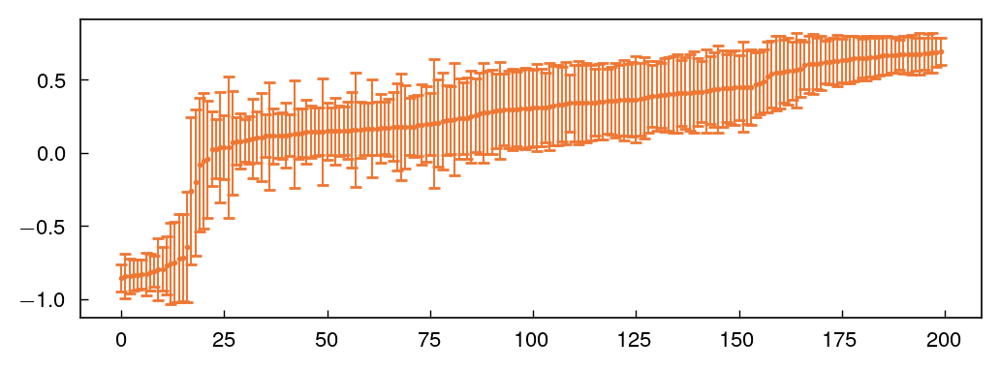

In [93]:
fig = plt.figure(figsize=(6, 2), dpi=200)
sort_ids = np.argsort(cluster_green[0].squeeze())
plt.errorbar(
    np.arange(k),
    cluster_green[0].squeeze()[sort_ids],
    yerr=cluster_green[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)

In [94]:
cluster_blue = compute_cluster_average(dtrajs0, c_blue[..., None], k=k)

<ErrorbarContainer object of 3 artists>

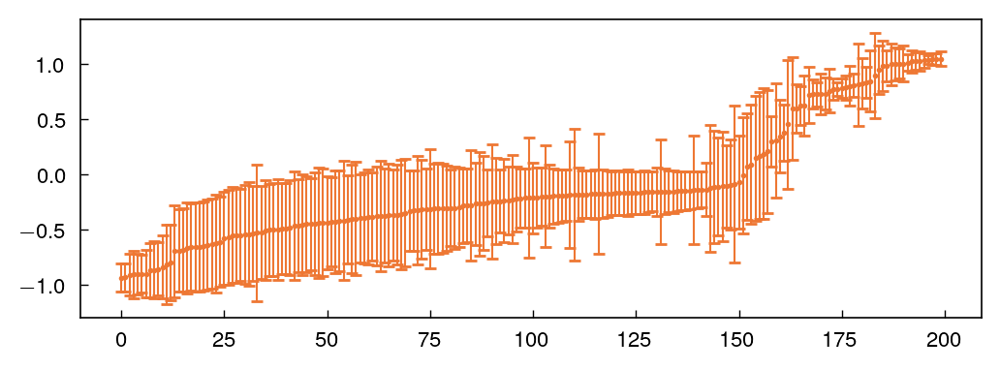

In [95]:
sort_ids = np.argsort(cluster_blue[0].squeeze())
fig = plt.figure(figsize=(6, 2), dpi=200)
plt.errorbar(
    np.arange(k),
    cluster_blue[0].squeeze()[sort_ids],
    yerr=cluster_blue[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)

In [96]:
cluster_p71 = compute_cluster_average(dtrajs0, p71_cis[..., None], k=k)

<ErrorbarContainer object of 3 artists>

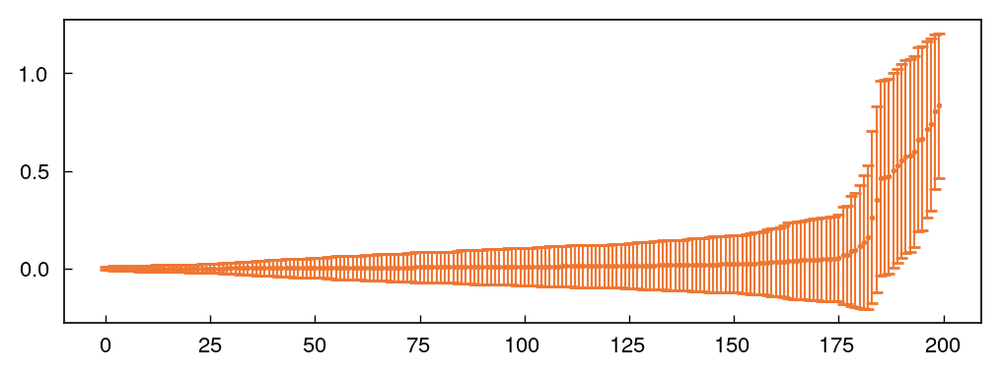

In [97]:
fig = plt.figure(figsize=(6, 2), dpi=200)
sort_ids = np.argsort(cluster_p71[0].squeeze())
plt.errorbar(
    np.arange(k),
    cluster_p71[0].squeeze()[sort_ids],
    yerr=cluster_p71[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)

In [98]:
cluster_qcore = compute_cluster_average(dtrajs0, q_core[..., None], k=k)

<ErrorbarContainer object of 3 artists>

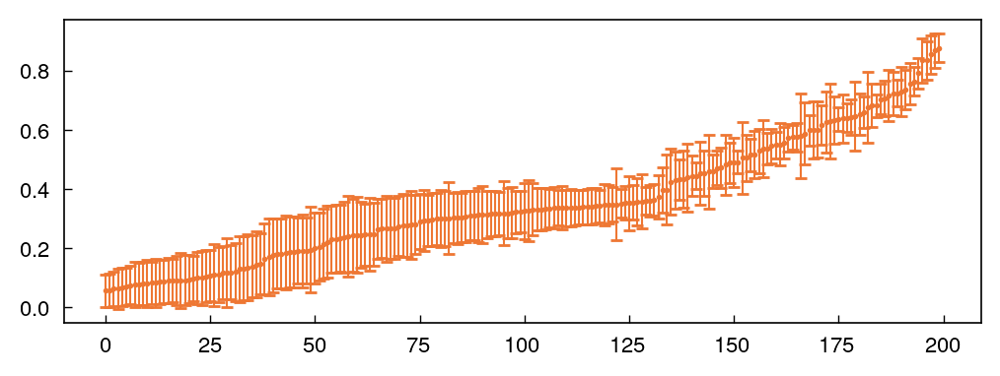

In [99]:
fig = plt.figure(figsize=(6, 2), dpi=200)
sort_ids = np.argsort(cluster_qcore[0].squeeze())
plt.errorbar(
    np.arange(k),
    cluster_qcore[0].squeeze()[sort_ids],
    yerr=cluster_qcore[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)

### cluster with proline

use $\cos(\omega)$ which gives about +1 for $\omega \sim 0$ (cis) and -1 for $\omega \sim \pi$ (trans)

In [101]:
omega_features = np.cos(omegas[..., 3:])
k = 200
feature_trajs = np.concatenate([np.asarray(ivac_trajs)[..., 1:], omega_features], axis=-1)
print(feature_trajs.shape)

(22989, 1001, 8)


(array([7298801., 3748414.,  975563.,  174490.,   37857.,   24114.,
          41925.,   98156.,  216733.,  410110.,  393396.,  184325.,
          64245.,   21661.,   13326.,   26032.,   91157.,  424192.,
        2245618., 6521874.]),
 array([-3.1415925 , -2.82743335, -2.51327395, -2.1991148 , -1.88495553,
        -1.57079625, -1.25663698, -0.94247776, -0.62831849, -0.31415924,
         0.        ,  0.31415924,  0.62831849,  0.94247776,  1.25663698,
         1.57079625,  1.88495553,  2.1991148 ,  2.51327395,  2.82743335,
         3.1415925 ]),
 <BarContainer object of 20 artists>)

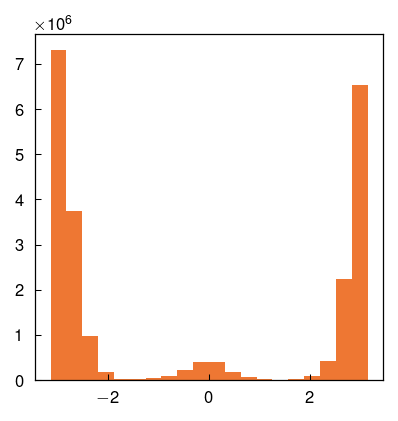

In [104]:
plt.hist(np.concatenate(omegas[..., 3]), bins=20)

(array([[1.2831468e+07, 3.4238580e+06, 1.8664590e+06, 1.1214350e+06,
         7.0491900e+05, 4.5890000e+05, 3.0721400e+05, 2.1342300e+05,
         1.5108000e+05, 1.0865900e+05, 8.0290000e+04, 6.0387000e+04,
         4.5602000e+04, 3.5374000e+04, 2.7570000e+04, 2.1916000e+04,
         1.7430000e+04, 1.4191000e+04, 1.1698000e+04, 9.6380000e+03,
         8.4010000e+03, 7.0630000e+03, 6.2760000e+03, 5.5240000e+03,
         5.2230000e+03, 4.8370000e+03, 4.5730000e+03, 4.4620000e+03,
         4.6260000e+03, 4.7530000e+03, 4.9720000e+03, 5.1940000e+03,
         5.5560000e+03, 6.1410000e+03, 6.8440000e+03, 7.7030000e+03,
         8.8450000e+03, 1.0389000e+04, 1.2223000e+04, 1.4645000e+04,
         1.7598000e+04, 2.1384000e+04, 2.7087000e+04, 3.4672000e+04,
         4.5045000e+04, 5.9795000e+04, 8.2731000e+04, 1.2251800e+05,
         2.0673500e+05, 7.4466300e+05],
        [1.5457914e+07, 2.9140280e+06, 1.3061140e+06, 6.9019500e+05,
         3.9880200e+05, 2.4671500e+05, 1.5878300e+05, 1.0747400

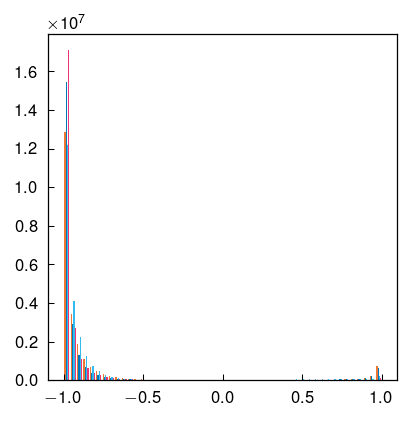

In [102]:
plt.hist(np.concatenate(omega_features), bins=50)

In [105]:
dtrajs1 = kmeans_cluster(feature_trajs, k)

________________________________________________________________________________
[Memory] Calling __main__--scratch-local-jobs-15766754-ipykernel-3348954603.kmeans_cluster...
kmeans_cluster(array([[[ 1.61362 , ..., -0.993827],
        ...,
        [ 1.529122, ..., -0.995566]],

       ...,

       [[-0.854386, ..., -0.793756],
        ...,
        [-0.821029, ..., -0.993653]]]), 
200)


/beagle3/dinner/scguo/envs/md/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


________________________________________________kmeans_cluster - 771.3s, 12.9min


/scratch/local/jobs/15766754/ipykernel_1582212/3656312051.py:1: UserWarning: Persisting input arguments took 2.55s to run.If this happens often in your code, it can cause performance problems (results will be correct in all cases). The reason for this is probably some large input arguments for a wrapped function.
  dtrajs1 = kmeans_cluster(feature_trajs, k)


In [166]:
n_per_cluster = np.zeros(k)
for i in range(k):
    n_per_cluster[i] = np.count_nonzero(dtrajs1 == i)

In [106]:
cluster_ncis = compute_cluster_average(dtrajs1, n_cis[..., None], k=k)

<BarContainer object of 200 artists>

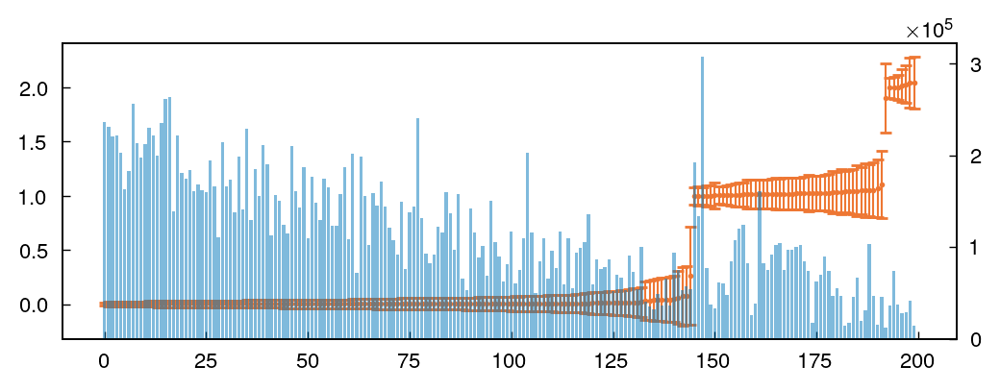

In [168]:
fig = plt.figure(figsize=(6, 2), dpi=200)
sort_ids = np.argsort(cluster_ncis[0].squeeze())
plt.errorbar(
    np.arange(k),
    cluster_ncis[0].squeeze()[sort_ids],
    yerr=cluster_ncis[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)
plt.twinx()
plt.bar(np.arange(k), n_per_cluster[sort_ids], color='C1', alpha=0.5, zorder=0)

In [108]:
cluster_green = compute_cluster_average(dtrajs1, c_green[..., None], k=k)

<BarContainer object of 200 artists>

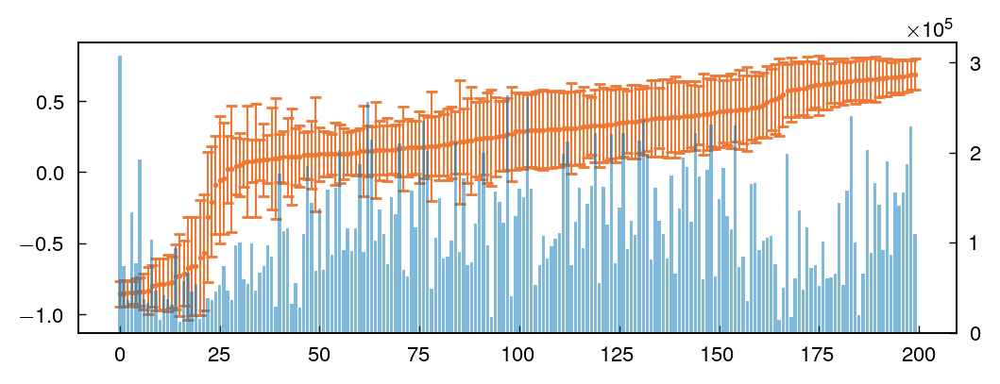

In [169]:
fig = plt.figure(figsize=(6, 2), dpi=200)
sort_ids = np.argsort(cluster_green[0].squeeze())
plt.errorbar(
    np.arange(k),
    cluster_green[0].squeeze()[sort_ids],
    yerr=cluster_green[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)
plt.twinx()
plt.bar(np.arange(k), n_per_cluster[sort_ids], color='C1', alpha=0.5, zorder=0)

In [110]:
cluster_blue = compute_cluster_average(dtrajs1, c_blue[..., None], k=k)

<BarContainer object of 200 artists>

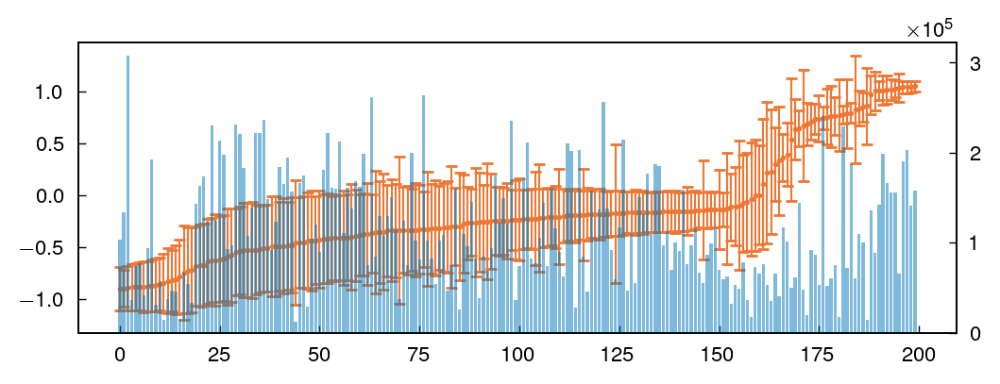

In [170]:
sort_ids = np.argsort(cluster_blue[0].squeeze())
fig = plt.figure(figsize=(6, 2), dpi=200)
plt.errorbar(
    np.arange(k),
    cluster_blue[0].squeeze()[sort_ids],
    yerr=cluster_blue[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)
plt.twinx()
plt.bar(np.arange(k), n_per_cluster[sort_ids], color='C1', alpha=0.5, zorder=0)

In [112]:
cluster_p71 = compute_cluster_average(dtrajs1, p71_cis[..., None], k=k)

<BarContainer object of 200 artists>

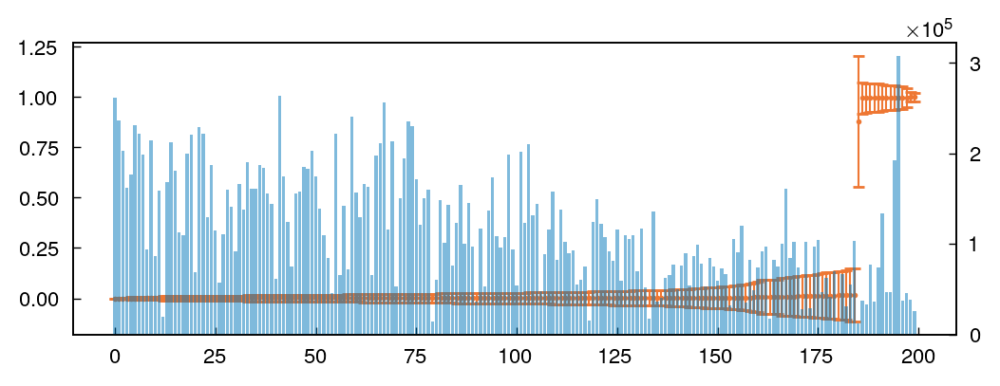

In [171]:
fig = plt.figure(figsize=(6, 2), dpi=200)
sort_ids = np.argsort(cluster_p71[0].squeeze())
plt.errorbar(
    np.arange(k),
    cluster_p71[0].squeeze()[sort_ids],
    yerr=cluster_p71[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)
plt.twinx()
plt.bar(np.arange(k), n_per_cluster[sort_ids], color='C1', alpha=0.5, zorder=0)

In [247]:
cluster_p70 = compute_cluster_average(dtrajs1, p70_cis[..., None], k=k)

<BarContainer object of 200 artists>

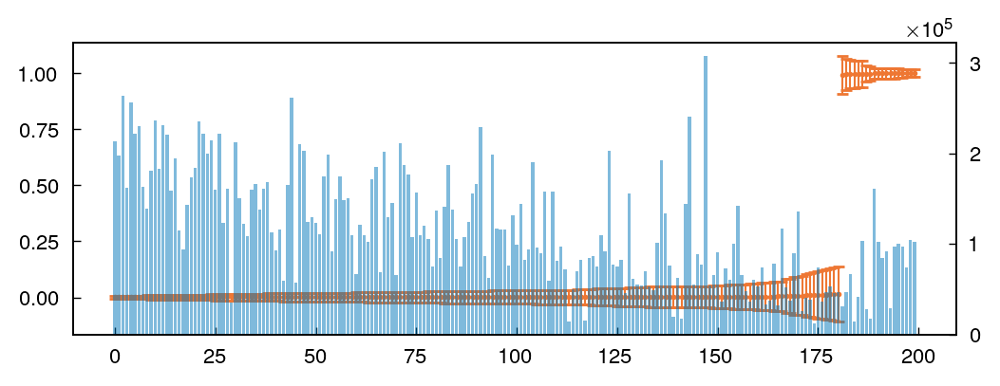

In [248]:
fig = plt.figure(figsize=(6, 2), dpi=200)
sort_ids = np.argsort(cluster_p70[0].squeeze())
plt.errorbar(
    np.arange(k),
    cluster_p70[0].squeeze()[sort_ids],
    yerr=cluster_p70[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)
plt.twinx()
plt.bar(np.arange(k), n_per_cluster[sort_ids], color='C1', alpha=0.5, zorder=0)

In [114]:
cluster_qcore = compute_cluster_average(dtrajs1, q_core[..., None], k=k)

<BarContainer object of 200 artists>

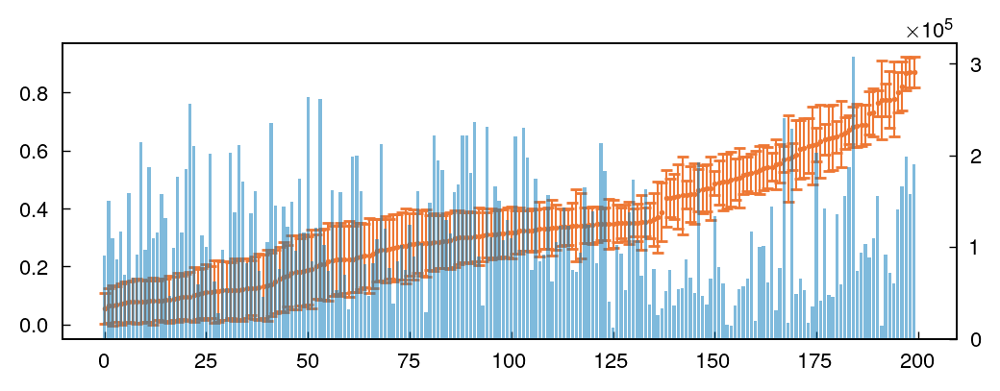

In [172]:
fig = plt.figure(figsize=(6, 2), dpi=200)
sort_ids = np.argsort(cluster_qcore[0].squeeze())
plt.errorbar(
    np.arange(k),
    cluster_qcore[0].squeeze()[sort_ids],
    yerr=cluster_qcore[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)
plt.twinx()
plt.bar(np.arange(k), n_per_cluster[sort_ids], color='C1', alpha=0.5, zorder=0)

In [118]:
cluster_orange = compute_cluster_average(dtrajs1, c_orange[..., None], k=k)

<BarContainer object of 200 artists>

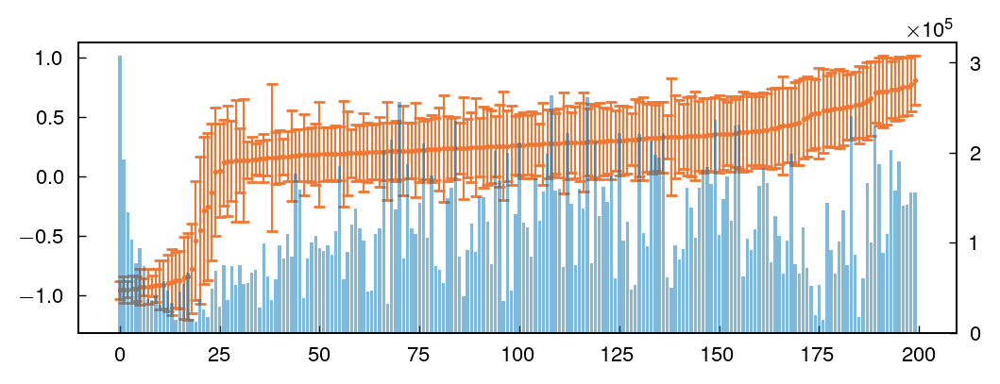

In [173]:
fig = plt.figure(figsize=(6, 2), dpi=200)
sort_ids = np.argsort(cluster_orange[0].squeeze())
plt.errorbar(
    np.arange(k),
    cluster_orange[0].squeeze()[sort_ids],
    yerr=cluster_orange[1].squeeze()[sort_ids],
    fmt=".",
    capsize=2,
)
plt.twinx()
plt.bar(np.arange(k), n_per_cluster[sort_ids], color='C1', alpha=0.5, zorder=0)

In [117]:
np.save(f"{data_dir}/dtrajs_ivac_omegas.npy", dtrajs1)

# DGA calculations

## basis

In [121]:
def make_sparse_basis(dtrajs):
    """Converts a discretized trajectory (e.g. from k-means clustering)
    into a sparse basis of indicator functions.

    Parameters
    ----------
    dtrajs : ndarray
        discretized trajectories

    Return
    ------
    basis : scipy.sparse.csr_matrix
    """
    nclusters = len(np.unique(dtrajs))
    rows, cols = [], []
    for i in range(nclusters):
        pts = np.argwhere(dtrajs == i)
        # indices of which frames are in the cluster i
        rows.append(pts.squeeze())
        # all assigned as 1 in the basis
        cols.append(np.repeat(i, len(pts)))
    rows = np.hstack(rows)
    cols = np.hstack(cols)
    data = np.ones(len(rows), dtype=float)
    basis = scipy.sparse.csr_matrix((data, (rows, cols)), shape=(len(dtrajs), nclusters))
    return basis

In [190]:
# split into lists of arrays
basis_arr = make_sparse_basis(np.squeeze(dtrajs1))
basis_d_arr = basis_arr.copy()
basis_d_arr[in_fs_arr] = 0
basis_d_arr[in_gs_arr] = 0

/beagle3/dinner/scguo/envs/md/lib/python3.11/site-packages/scipy/sparse/_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


In [246]:
print(np.where(np.sum(basis_d_arr, axis=0) == 0))

(array([], dtype=int64), array([], dtype=int64))


In [192]:
basis_d, basis = [], []
n_traj, n_frame = c_green.shape[:2]
for i in range(n_traj):
    basis.append(basis_arr[i * n_frame : (i + 1) * n_frame, :-1])
    basis_d.append(basis_d_arr[i * n_frame : (i + 1) * n_frame])

In [193]:
print(len(basis_d), basis_d[0].shape)
print(len(basis), basis[0].shape)

22989 (1001, 200)
22989 (1001, 199)


## weights

In [139]:
lags = [10, 20, 50, 100]
dga_w = []
for lag in lags:
    guess_w = np.array(np.broadcast_to(sample_w[..., None], q_gs.shape))
    guess_w[:, -lag:] = 0
    dga_w.append(extq.dga.reweight(basis, lag, guess=guess_w, normalize=False))

In [144]:
for w in dga_w:
    print(np.asarray(w)[::10, 0] / sample_w[::10])

[1.05443206 1.07909456 1.05969748 ... 1.01609451 0.98763688 1.00880378]
[1.08691687 1.14009764 1.10543494 ... 1.02298236 0.97728236 1.01147017]
[1.15311913 1.29973748 1.19876459 ... 1.03947892 0.96441667 1.01903252]
[1.22833879 1.67470068 1.37548881 ... 1.06608989 0.9671053  1.02751479]


look at PMFs with added DGA correction

/scratch/local/jobs/15766754/ipykernel_1582212/2370970689.py:15: RuntimeWarning: divide by zero encountered in log
  offset = np.min(-np.log(dens))
/scratch/local/jobs/15766754/ipykernel_1582212/2370970689.py:16: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(dens) - offset


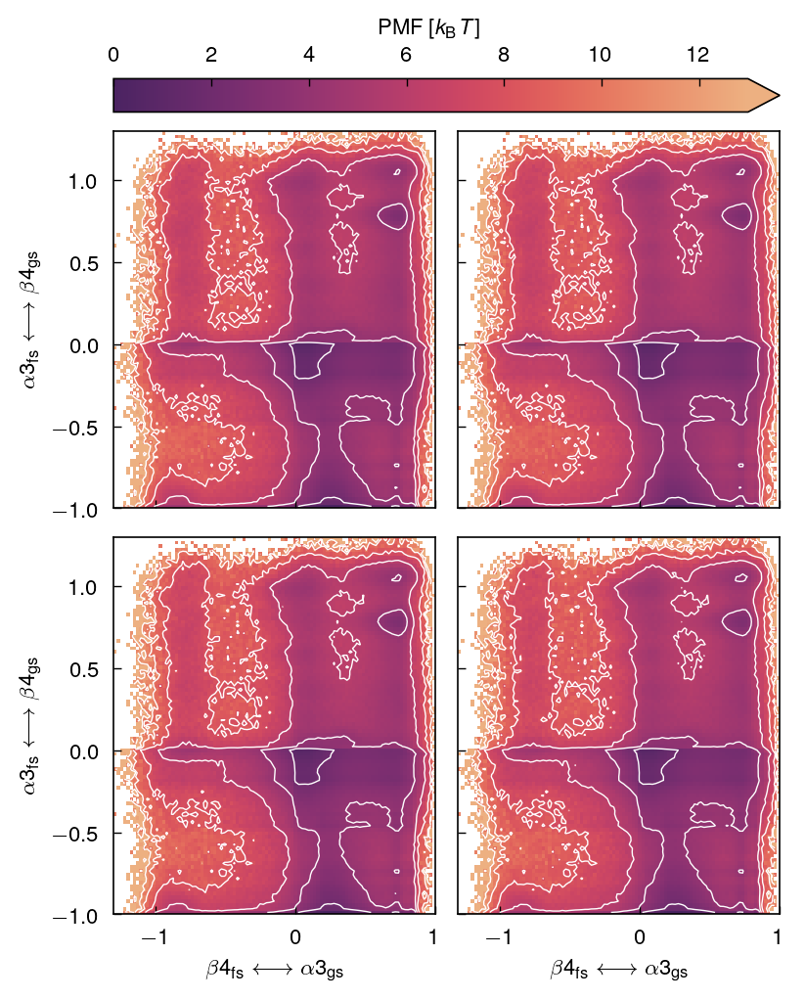

In [147]:
cv1, cv2 = "green", "blue"
xe = np.linspace(*lims[cv1], 101)
ye = np.linspace(*lims[cv2], 101)
xc = (xe[:-1] + xe[1:]) / 2
yc = (ye[:-1] + ye[1:]) / 2
clines = np.arange(0, 13, 2)

fig, axes = plt.subplots(2, 2, figsize=(4, 5), dpi=200, sharex=True, sharey=True, constrained_layout=True)
for ax, lag, w in zip(axes.flat, lags, dga_w):
    cv1_lag = cvs[cv1][:, lag:]
    cv2_lag = cvs[cv2][:, lag:]
    dens = extq.projection.density2d(cv1_lag, cv2_lag, np.asarray(w)[:, :-lag], xe, ye)
    offset = np.min(-np.log(dens))
    pmf = -np.log(dens) - offset
    pc = ax.pcolormesh(xc, yc, pmf.T, vmax=13, cmap="flare_r", rasterized=True)
    ax.contour(xc, yc, pmf.T, colors="white", levels=clines, linewidths=0.5)
    ax.set_xlabel(labels[cv1])
    ax.set_ylabel(labels[cv2])
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[0], extend="max", location="top")
cb.set_label(r"PMF [$k_{\mathrm{B}}T$]")

Just use the REMD weights

## Committors

In [194]:
in_d = ~(in_gs | in_fs)
print(in_d.shape)

(22989, 1001)


In [195]:
@memory.cache
def compute_committor(lag, mem):
    qp = extq.memory.forward_committor(basis_d, w, in_d, in_fs.astype(float), lag, mem)
    qm = extq.memory.backward_committor(basis_d, w, in_d, in_gs.astype(float), lag, mem)
    return qp, qm

In [154]:
qp_gs2fs, qm_gs2fs = {}, {}
mems = [0, 1, 4]
for lag in lags:
    w = np.array(np.broadcast_to(sample_w[..., None], q_gs.shape))
    w[:, -lag:] = 0
    for mem in mems:
        print(f"Computing committors with lag {lag} and mem {mem}")
        qp, qm = compute_committor(lag, mem)
        qp_gs2fs[(lag, mem)] = qp
        qm_gs2fs[(lag, mem)] = qm

Computing committors with lag 10 and mem 0
________________________________________________________________________________
[Memory] Calling __main__--scratch-local-jobs-15766754-ipykernel-3645651309.compute_committor...
compute_committor(10, 0)
______________________________________________compute_committor - 413.6s, 6.9min
Computing committors with lag 10 and mem 1
________________________________________________________________________________
[Memory] Calling __main__--scratch-local-jobs-15766754-ipykernel-3645651309.compute_committor...
compute_committor(10, 1)
______________________________________________compute_committor - 449.9s, 7.5min
Computing committors with lag 10 and mem 4
________________________________________________________________________________
[Memory] Calling __main__--scratch-local-jobs-15766754-ipykernel-3645651309.compute_committor...
compute_committor(10, 4)
______________________________________________compute_committor - 566.6s, 9.4min
Computing committor

/project/dinner/scguo/extq/src/extq/projection.py:145: RuntimeWarning: invalid value encountered in divide
  return numer / denom


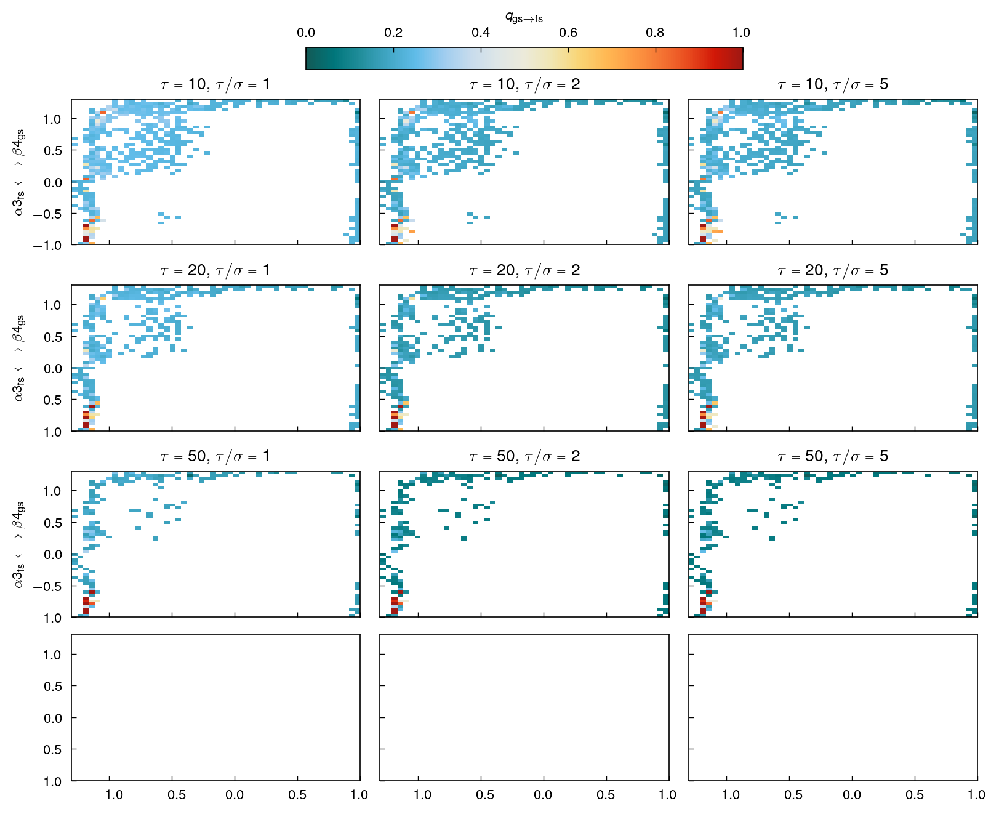

In [156]:
# plot against "GT" and "BT"
fig, axes = plt.subplots(
    nrows=4, ncols=3, figsize=(8, 6.5), dpi=200, sharex=True, sharey=True, constrained_layout=True
)

cv1, cv2 = "green", "blue"
xe = np.linspace(*lims[cv1], 51)
ye = np.linspace(*lims[cv2], 51)
xc = (xe[:-1] + xe[1:]) / 2
yc = (ye[:-1] + ye[1:]) / 2

for i in range(3):
    lag = lags[i]
    for j in range(3):
        mem = mems[j]
        ax = axes[i, j]
        q = qp_gs2fs[(lag, mem)]
        hist = extq.projection.average2d(cvs[cv1], cvs[cv2], q, np.broadcast_to(sample_w[..., None], q_gs.shape), xe, ye)
        pc = ax.pcolormesh(xc, yc, hist.T, cmap="nightfall", vmin=0, vmax=1)
        ax.set_xlabel(labels[cv1])
        ax.set_ylabel(labels[cv2])
        ax.set_title(f"$\\tau = {lag}$, $\\tau/\\sigma = {mem + 1}$")
        ax.label_outer()
cb = plt.colorbar(pc, ax=axes[0], location='top', label=r"$q_{\mathrm{gs}\rightarrow\mathrm{fs}}$")

In [253]:
lag = 5
mem = 0
w = np.array(np.broadcast_to(sample_w[..., None], q_gs.shape))
w[:, -lag:] = 0
qp = extq.dga.forward_committor(basis_d, w, in_d, in_fs.astype(float), lag)
qm = extq.memory.backward_committor(basis_d, w, in_d, in_gs.astype(float), lag, mem)

In [ ]:
_ = plt.hist(np.concatenate(qp), bins=50)